In [1]:
import os, random, argparse, pandas as pd, numpy as np, seaborn as sns
from tqdm import tqdm
import torch, torch.nn as nn


# set random seed
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
SEED = 10
random.seed(SEED)
np.random.seed(SEED)
torch.random.manual_seed(SEED)

import sys
sys.path.append('../')
# load package requirments
from DeepRUOT.losses import MMD_loss, OT_loss1, OT_loss2, Density_loss, Local_density_loss 
from DeepRUOT.utils import group_extract, sample, to_np, generate_steps, cal_mass_loss, parser, _valid_criterions
from DeepRUOT.plots import plot_comparision, plot_losses
# from DeepRUOT.train import train_un1,pretrain
from DeepRUOT.train import train_un1
from src.train import pretrain
from DeepRUOT.models import velocityNet, growthNet, scoreNet, dediffusionNet, indediffusionNet, FNet, ODEFunc2
from DeepRUOT.constants import ROOT_DIR, DATA_DIR, NTBK_DIR, IMGS_DIR, RES_DIR
from DeepRUOT.exp import setup_exp
from DeepRUOT.eval import generate_plot_data
from torchdiffeq import odeint_adjoint as odeint
#from torchdiffeq import odeint

# for geodesic learning
from scipy.spatial import distance_matrix
from sklearn.gaussian_process.kernels import RBF
from sklearn.manifold import MDS

2025-08-26 14:02:01.038126: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-08-26 14:02:01.046801: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-08-26 14:02:01.049397: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-08-26 14:02:01.531085: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
import torch.optim as optim

dim=2
f_net = FNet(in_out_dim=dim, hidden_dim=128, n_hiddens=3, activation='leakyrelu')


import sys

# Simulate the command-line arguments
sys.argv = [
    'DeepRUOT Training',
    '-d', 'file',
    '-c', 'ot1',
    '-n', 'simulation_gene_ours_regm=5',
]

args = parser.parse_args()
opts = vars(args)

# Display the parsed arguments
print(opts)

# device = torch.device('cpu')
device = torch.device('cuda')
device


{'dataset': 'file', 'time_col': None, 'name': 'simulation_gene_ours_regm=5', 'output_dir': '/home/pqw/project/wfr_fm/results', 'local_epochs': 5, 'epochs': 15, 'local_post_epochs': 5, 'criterion': 'ot1', 'batches': 100, 'cuda': True, 'sample_size': 100, 'sample_with_replacement': False, 'hold_one_out': True, 'hold_out': 'random', 'apply_losses_in_time': True, 'top_k': 5, 'hinge_value': 0.01, 'use_density_loss': True, 'use_local_density': False, 'lambda_density': 1.0, 'lambda_density_local': 1.0, 'lambda_local': 0.2, 'lambda_global': 0.8, 'model_layers': [64], 'use_geo': False, 'geo_layers': [32], 'geo_features': 5, 'n_points': 100, 'n_trajectories': 30, 'n_bins': 100}


device(type='cuda')

In [3]:
df=pd.read_csv(DATA_DIR + '/simulation_gene_data.csv')
 # make output dir
if not os.path.isdir(opts['output_dir']):
    os.makedirs(opts['output_dir'])
exp_dir, logger = setup_exp(opts['output_dir'], opts, opts['name'])
  # load dataset
logger.info(f'Loading dataset: '+opts['name'])


In [4]:
 # setup groups
groups = sorted(df.samples.unique())
steps = generate_steps(groups)
# logger.info(f'Defining model')
use_geo = opts['use_geo']
model_layers = opts['model_layers']
model_features = len(df.columns) - 1

# logger.info(f'Defining optimizer and criterion')
optimizer = torch.optim.Adam(f_net.parameters(),lr=1e-4)

opts['criterion']='ot1'
criterion =  _valid_criterions[opts['criterion']]()

# logger.info(f'Extracting parameters')
use_cuda = torch.cuda.is_available() and opts['cuda']
sample_size = (opts['sample_size'], )
sample_with_replacement = opts['sample_with_replacement' ]
apply_losses_in_time = opts['apply_losses_in_time']


n_local_epochs = opts['local_epochs']
n_epochs = opts['epochs']
n_post_local_epochs = opts['local_post_epochs']
n_batches = opts['batches']

hold_one_out = opts['hold_one_out']
hold_out = opts['hold_out']
    
hinge_value = opts['hinge_value']
top_k = opts['top_k']
lambda_density = opts['lambda_density']
lambda_density_local = opts['lambda_density_local']
use_density_loss = opts['use_density_loss']
use_local_density = opts['use_local_density']
    
lambda_local = opts['lambda_local']
lambda_global = opts['lambda_global']

n_points=opts['n_points']
n_trajectories=opts['n_trajectories'] 
n_bins=opts['n_bins']
    
    
local_losses = {f'{t0}:{t1}':[] for (t0, t1) in steps}
batch_losses = []
globe_losses = []

In [5]:
f_net=f_net.to(device)

In [6]:
f_net.v_net

velocityNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (net): ModuleList(
    (0): Sequential(
      (0): Linear(in_features=3, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (1-2): 2 x Sequential(
      (0): Linear(in_features=128, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
  )
  (out): Linear(in_features=128, out_features=2, bias=True)
)

In [7]:
f_net.g_net

growthNet(
  (activation): LeakyReLU(negative_slope=0.01)
  (net): Sequential(
    (0): Linear(in_features=3, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=128, out_features=128, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [8]:
initial_size=df[df['samples']==0].x1.shape[0]
initial_size

400

In [9]:
sample_sizes = df.groupby('samples').size()
ref0 = sample_sizes / sample_sizes.iloc[0]  
relative_mass = torch.tensor(ref0.values) 
relative_mass

tensor([1.0000, 1.1050, 1.3250, 1.7250, 2.4225], dtype=torch.float64)

In [10]:
sample_size = (df[df['samples']==0.0].values.shape[0],)

In [11]:
# f_net,v_losses,g_losses,losses = pretrain(f_net,df,optimizer,n_epoch=200,hold_out=None,logger=logger,relative_mass=relative_mass,reg=0.003,reg_m=[50,np.inf])  

In [12]:
f_net,v_losses,g_losses,losses = pretrain(f_net,df,optimizer, delta=1.5, batch_size=300, n_epoch=1000,hold_out=None,logger=logger,relative_mass=relative_mass)

relative_mass tensor([1.0000, 1.1050, 1.3250, 1.7250, 2.4225], dtype=torch.float64)
t_train: [0, 1, 2, 3, 4]


Computing UOT plans...:  25%|██▌       | 1/4 [00:00<00:01,  2.04it/s]

True


Computing UOT plans...:  50%|█████     | 2/4 [00:01<00:01,  1.65it/s]

False


Computing UOT plans...:  75%|███████▌  | 3/4 [00:02<00:00,  1.22it/s]

True


Computing UOT plans...: 100%|██████████| 4/4 [00:05<00:00,  1.31s/it]


True


Begin flow and growth matching...: 100%|██████████| 1000/1000 [00:37<00:00, 26.65epoch/s, loss=0.005847, vloss=0.005532, gloss=0.000315]


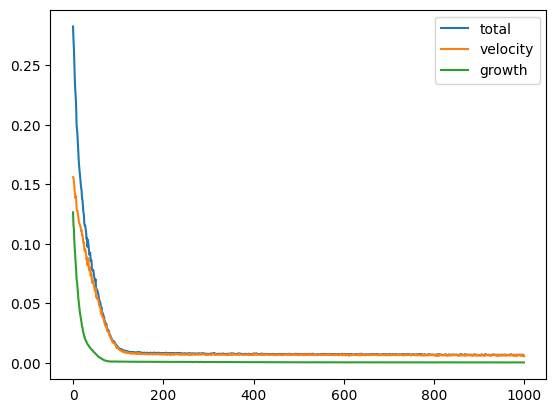

In [13]:
import matplotlib.pyplot as plt
plt.plot(losses,label='total')
plt.plot(v_losses,label='velocity')
plt.plot(g_losses,label='growth')
plt.legend()

In [14]:
torch.save(f_net.state_dict(), os.path.join(exp_dir+'/pretrain_best_model'))

In [15]:
f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/pretrain_best_model'),map_location=torch.device('cpu')))

/tmp/ipykernel_580071/4902511.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/pretrain_best_model'),map_location=

<All keys matched successfully>

In [16]:
optimizer = torch.optim.Adam(f_net.parameters(),lr=1e-4)

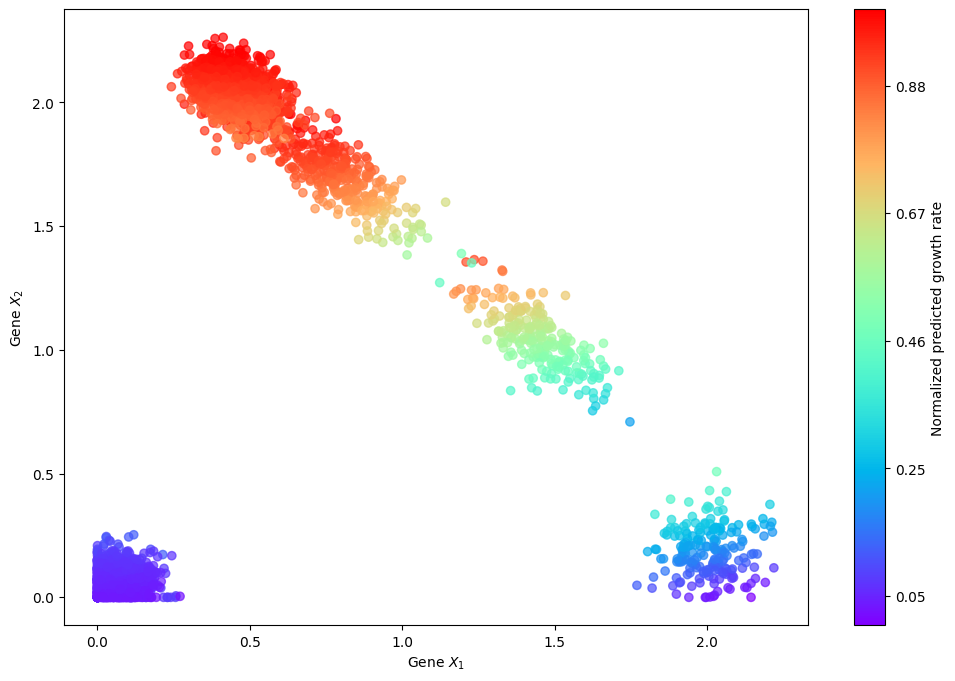

In [17]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def plot_g_values(df, f_net, device=device, output_file='plot.pdf'):
    time_points = df['samples'].unique()
    
    data_by_time = {}
    
    for time in time_points:
        subset = df[df['samples'] == time]
        x = torch.tensor(subset['x1'].values, dtype=torch.float32).to(device)
        y = torch.tensor(subset['x2'].values, dtype=torch.float32).to(device)
        data = torch.stack([x, y], dim=1)
        
        with torch.no_grad():
            t = torch.tensor([time], dtype=torch.float32).to(device)
            _, g, _, _ = f_net(t, data)
        
        data_by_time[time] = {'data': subset, 'g_values': g.detach().cpu().numpy()}
    
    all_g_values = np.concatenate([content['g_values'] for content in data_by_time.values()])
    
    vmax_value = np.percentile(all_g_values, 99)
    
    norm = plt.Normalize(vmin=all_g_values.min(), vmax=vmax_value, clip=True)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    for time, content in data_by_time.items():
        subset = content['data']
        g_values = content['g_values']
        x = subset['x1']
        y = subset['x2']
        
        colors = plt.cm.rainbow(norm(g_values))
        
        ax.scatter(x, y, color=colors, label=f'Time {time}', alpha=0.7, marker='o')
    
    ax.set_xlabel('Gene $X_1$')
    ax.set_ylabel('Gene $X_2$')
    
    sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
    sm.set_array(all_g_values)
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('Normalized predicted growth rate')
    
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{norm(x):.2f}'))
    
    plt.show()

plot_g_values(df, f_net, output_file='gene_growth_pre_post.pdf')

In [18]:
# f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/best_model'),map_location=torch.device('cpu')))

In [19]:
# generate plot data
f_net.to('cpu')
use_cuda=False
generated, trajectories,generated_weights,trajectories_weights = generate_plot_data(
    f_net, df, n_points=400, n_trajectories=400, n_bins=100, 
    sample_with_replacement=True, use_cuda=use_cuda, samples_key='samples',
    logger=logger
    )


tensor([0., 1., 2., 3., 4.])
<class 'torch.Tensor'>
tensor([0.0000, 0.0404, 0.0808, 0.1212, 0.1616, 0.2020, 0.2424, 0.2828, 0.3232,
        0.3636, 0.4040, 0.4444, 0.4848, 0.5253, 0.5657, 0.6061, 0.6465, 0.6869,
        0.7273, 0.7677, 0.8081, 0.8485, 0.8889, 0.9293, 0.9697, 1.0101, 1.0505,
        1.0909, 1.1313, 1.1717, 1.2121, 1.2525, 1.2929, 1.3333, 1.3737, 1.4141,
        1.4545, 1.4949, 1.5354, 1.5758, 1.6162, 1.6566, 1.6970, 1.7374, 1.7778,
        1.8182, 1.8586, 1.8990, 1.9394, 1.9798, 2.0202, 2.0606, 2.1010, 2.1414,
        2.1818, 2.2222, 2.2626, 2.3030, 2.3434, 2.3838, 2.4242, 2.4646, 2.5051,
        2.5455, 2.5859, 2.6263, 2.6667, 2.7071, 2.7475, 2.7879, 2.8283, 2.8687,
        2.9091, 2.9495, 2.9899, 3.0303, 3.0707, 3.1111, 3.1515, 3.1919, 3.2323,
        3.2727, 3.3131, 3.3535, 3.3939, 3.4343, 3.4747, 3.5152, 3.5556, 3.5960,
        3.6364, 3.6768, 3.7172, 3.7576, 3.7980, 3.8384, 3.8788, 3.9192, 3.9596,
        4.0000])
<class 'torch.Tensor'>


In [20]:
trajectories.shape,generated.shape

((100, 400, 2), (5, 400, 2))

In [21]:
trajectories_weights.shape,generated_weights.shape

((100, 400), (5, 400))

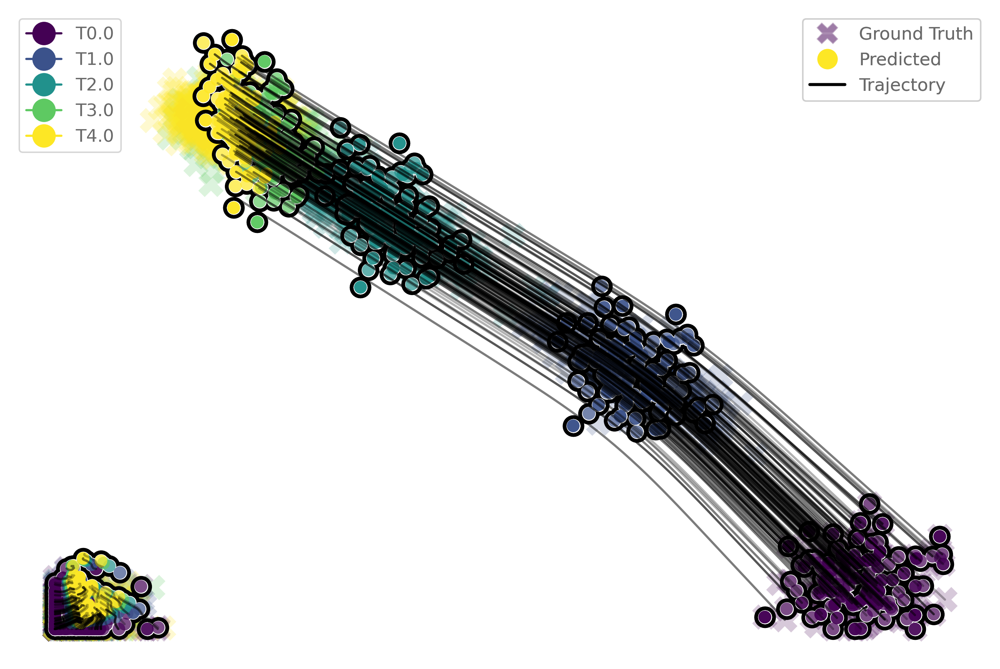

In [22]:
plot_comparision(
    df, generated, trajectories,
    palette = 'viridis', df_time_key='samples',
    save=True, path=exp_dir, file='comparision.png',
    x='x1', y='x2', is_3d=False
)

In [23]:
def plot_comparision_weights(
    df, generated, trajectories,
    generated_weights=None, trajectories_weights=None,
    palette='viridis', df_time_key='samples',
    save=False, path='imgs', file='comparision_weights.png',
):
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    import seaborn as sns
    import numpy as np
    import os

    if not os.path.isdir(path):
        os.makedirs(path)

    s = 1
    fig = plt.figure(figsize=(12/s, 8/s), dpi=300)
    ax = fig.add_subplot(1, 1, 1, projection='3d')

    # ground truth points: 只在 z=0 平面上画
    ax.scatter(
        df['x1'], df['x2'], np.zeros_like(df['x1']),
        c=df[df_time_key], alpha=0.3,
        cmap=palette,
        marker='X',
        label='Ground truth'
    )

    # prepare generated points: 拼接 (x, y, w) => z轴为weight
    if not isinstance(generated, np.ndarray):
        generated = [g.cpu().numpy() if hasattr(g, 'cpu') else g for g in generated]
    if not isinstance(generated_weights, np.ndarray):
        generated_weights = [gw.cpu().numpy() if hasattr(gw, 'cpu') else gw for gw in generated_weights]

    gen_xyz = [np.hstack([g, gw.reshape(-1, 1)]) for g, gw in zip(generated, generated_weights)]
    all_gen = np.concatenate(gen_xyz, axis=0)

    ax.scatter(
        all_gen[:, 0], all_gen[:, 1], all_gen[:, 2],
        c=all_gen[:, 2], cmap=palette,
        s=30, alpha=0.8,
        label='Generated'
    )

    # draw trajectories as lines in (x, y, w) space
    if trajectories is not None and trajectories_weights is not None:
        for traj, tw in zip(trajectories, trajectories_weights):
            if hasattr(traj, 'cpu'):
                traj = traj.cpu().numpy()
            if hasattr(tw, 'cpu'):
                tw = tw.cpu().numpy()
            traj3d = np.hstack([traj, tw.reshape(-1, 1)])
            ax.plot(traj3d[:, 0], traj3d[:, 1], traj3d[:, 2], alpha=0.1, color='black')

    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('weight')
    ax.set_title('3D Visualization (x, y, weight)')
    ax.legend()

    if save:
        try:
            fig.savefig(os.path.join(path, file))
        except ValueError:
            pass
    plt.close()
    return fig


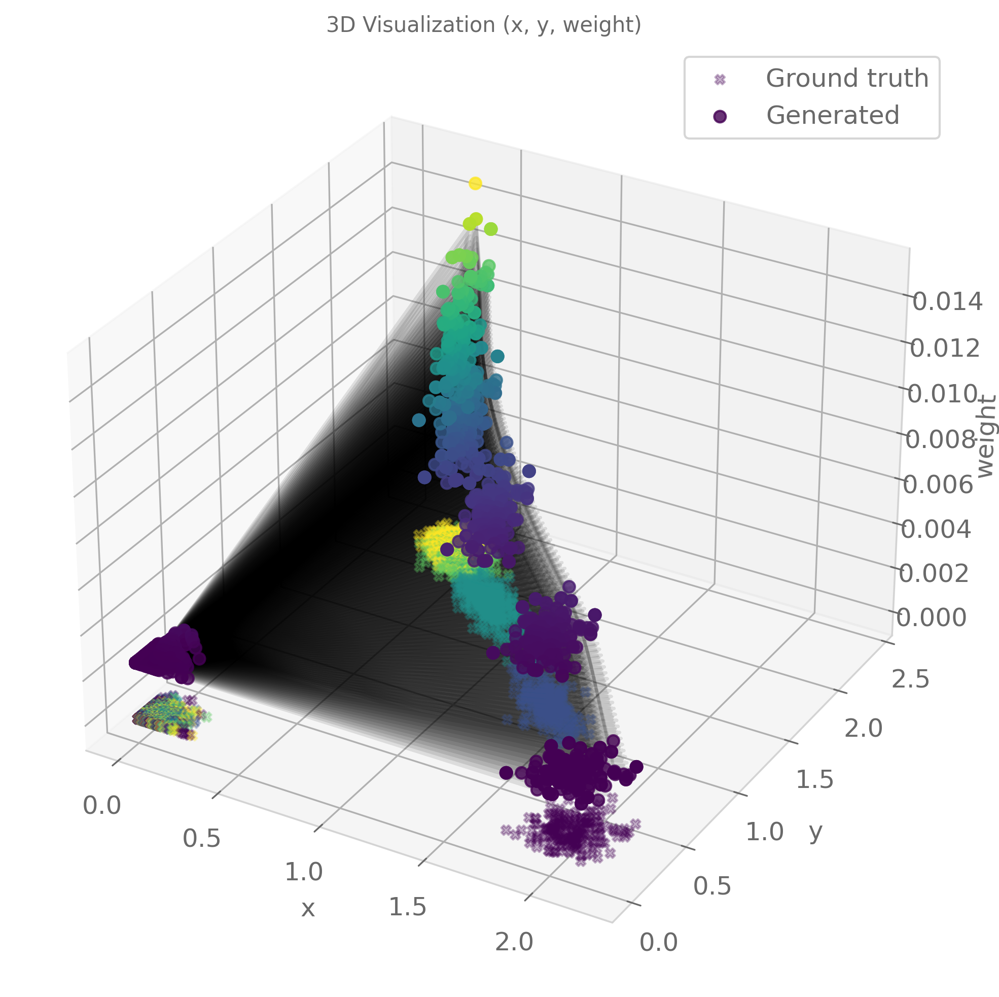

In [24]:
plot_comparision_weights(
    df, generated, trajectories,generated_weights=generated_weights, trajectories_weights=trajectories_weights,
    palette = 'viridis', df_time_key='samples',
    save=False, path=exp_dir, file='comparision_weights.png',
)

In [25]:
import numpy as np
import plotly.graph_objs as go
import os

def plot_comparision_plotly(
    df, generated, trajectories,
    generated_weights=None, trajectories_weights=None,
    path='imgs', file='comparison_plotly.html'
):
    if not os.path.exists(path):
        os.makedirs(path)

    fig = go.Figure()

    # 1. 真实数据点 (z = 0)
    # fig.add_trace(go.Scatter3d(
    #     x=df['x1'],
    #     y=df['x2'],
    #     z=np.zeros_like(df['x1']),
    #     mode='markers',
    #     marker=dict(size=4, color='gray', symbol='x'),
    #     name='Ground Truth (z=0)'
    # ))

    # 2. 生成点 (x, y, weight)
    gen_xyz = []
    if not isinstance(generated, np.ndarray):
        generated = [g.cpu().numpy() if hasattr(g, 'cpu') else g for g in generated]
    if not isinstance(generated_weights, np.ndarray):
        generated_weights = [gw.cpu().numpy() if hasattr(gw, 'cpu') else gw for gw in generated_weights]

    for g, gw in zip(generated, generated_weights):
        gen_xyz.append(np.hstack([g, gw.reshape(-1, 1)]))
    all_gen = np.concatenate(gen_xyz, axis=0)

    fig.add_trace(go.Scatter3d(
        x=all_gen[:, 0],
        y=all_gen[:, 1],
        z=all_gen[:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color=all_gen[:, 2],
            colorscale='Viridis',
            colorbar=dict(title='Weight'),
            opacity=0.8
        ),
        name='Generated Points'
    ))

    # 3. 轨迹线段 (x_t, y_t, weight_t)
    if trajectories is not None and trajectories_weights is not None:
        for traj, tw in zip(np.transpose(trajectories, (1, 0, 2)), np.transpose(trajectories_weights)):
            if hasattr(traj, 'cpu'):
                traj = traj.cpu().numpy()
            if hasattr(tw, 'cpu'):
                tw = tw.cpu().numpy()
            traj3d = np.hstack([traj, tw.reshape(-1, 1)])

            fig.add_trace(go.Scatter3d(
                x=traj3d[:, 0],
                y=traj3d[:, 1],
                z=traj3d[:, 2],
                mode='lines',
                line=dict(color='red', width=1),
                opacity=0.3,
                showlegend=False
            ))

    fig.update_layout(
    title='3D Trajectories and Generated Points (z = weight)',
    scene=dict(
        xaxis=dict(
            title='x',
            showbackground=False,  # 不显示背景面板
            showgrid=False,   
            showline=True,# 不显示网格线
            zeroline=False         # 不显示原点线
        ),
        yaxis=dict(
            title='y',
            showbackground=False,
            showgrid=False,
            showline=True,
            zeroline=False
        ),
        zaxis=dict(
            title='weight',
            showbackground=False,
            showgrid=False,
            showline=True,
            zeroline=False
        )
    ),
    margin=dict(l=0, r=0, b=0, t=30),
    legend=dict(x=0.02, y=0.98),
    paper_bgcolor='white',  # 画布背景为白色
    plot_bgcolor='white'    # 轴区域背景为白色
)


    save_path = os.path.join(path, file)
    fig.write_html(save_path)
    print(f"Plot saved to {save_path}")

    return fig


In [26]:
plot_comparision_plotly(
    df, generated, trajectories,generated_weights=generated_weights, trajectories_weights=trajectories_weights,
     path=exp_dir, file='comparision_weights.html',
)

Plot saved to /home/pqw/project/wfr_fm/results/simulation_gene_ours_regm=5/comparision_weights.html


### PreTrain velocity and growth

In [27]:
    if n_local_epochs > 0:
        logger.info(f'Beginning pretraining')
        for epoch in tqdm(range(1), desc='Pretraining Epoch'):
            l_loss, b_loss, g_loss = train_un1(
                f_net, df, groups, optimizer,50, 
                criterion = criterion, use_cuda = use_cuda,
                local_loss=True, global_loss=False, apply_losses_in_time=apply_losses_in_time,
                hold_one_out=hold_one_out, hold_out=hold_out, 
                 hinge_value=hinge_value, lambda_ot=0.1, lambda_mass=0, lambda_energy=0.001,
                 use_pinn=False, use_penalty=False,use_density_loss=False,lambda_density=10,
                top_k = top_k, sample_size = sample_size,relative_mass=relative_mass,initial_size=initial_size,
                sample_with_replacement = sample_with_replacement, logger=logger, device=device,best_model_path=exp_dir+'/best_model'
            )
            for k, v in l_loss.items():  
                local_losses[k].extend(v)
            batch_losses.extend(b_loss)
            globe_losses.extend(g_loss)

Pretraining Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

begin local loss


batch_0_0:
stepsize=1
relative_mass_pred:1.1012499332427979,relative_mass_now:1.105
diff_mass: tensor(-0.0038, dtype=torch.float64)
MC:0.003393725572128625
Otloss:0.0398078
mass loss:0.00744403
total loss:0.00398078
batch_0_1:
stepsize=1
relative_mass_pred:1.3238263130187988,relative_mass_now:1.325
diff_mass: tensor(-0.0012, dtype=torch.float64)
MC:0.000885801495246134
Otloss:0.0497421
mass loss:0.0156331
total loss:0.00497421
batch_0_2:
stepsize=1
relative_mass_pred:1.7478021383285522,relative_mass_now:1.725
diff_mass: tensor(0.0228, dtype=torch.float64)
MC:0.013218630915102699
Otloss:0.0570417
mass loss:0.0295158
total loss:0.00570417
batch_0_3:
stepsize=1
relative_mass_pred:2.460510730743408,relative_mass_now:2.4225
diff_mass: tensor(0.0380, dtype=torch.float64)
MC:0.015690704125245956
Otloss:0.0752319
mass loss:0.0558315
total loss:0.00752319


New minimum otloss found: 0.07523193955421448. Model saved.
batch_1_0:
stepsize=1
relative_mass_pred:1.104637622833252,relative_mass_now:1.105
diff_mass: tensor(-0.0004, dtype=torch.float64)
MC:0.0003279431373285331
Otloss:0.0390758
mass loss:0.00725431
total loss:0.00390758
batch_1_1:
stepsize=1
relative_mass_pred:1.3348424434661865,relative_mass_now:1.325
diff_mass: tensor(0.0098, dtype=torch.float64)
MC:0.0074282592197634474
Otloss:0.0474194
mass loss:0.0100072
total loss:0.00474194
batch_1_2:
stepsize=1
relative_mass_pred:1.7528009414672852,relative_mass_now:1.725
diff_mass: tensor(0.0278, dtype=torch.float64)
MC:0.016116487807121778
Otloss:0.0674535
mass loss:0.0199765
total loss:0.00674535
batch_1_3:
stepsize=1
relative_mass_pred:2.4150848388671875,relative_mass_now:2.4225
diff_mass: tensor(-0.0074, dtype=torch.float64)
MC:0.0030609540279927247
Otloss:0.0987206
mass loss:0.150639
total loss:0.00987206


batch_2_0:
stepsize=1
relative_mass_pred:1.1018812656402588,relative_mass_now:1.105
diff_mass: tensor(-0.0031, dtype=torch.float64)
MC:0.0028223840359648806
Otloss:0.0393797
mass loss:0.00672575
total loss:0.00393797
batch_2_1:
stepsize=1
relative_mass_pred:1.3220330476760864,relative_mass_now:1.325
diff_mass: tensor(-0.0030, dtype=torch.float64)
MC:0.002239209301066815
Otloss:0.0497254
mass loss:0.0113882
total loss:0.00497254
batch_2_2:
stepsize=1
relative_mass_pred:1.7284027338027954,relative_mass_now:1.725
diff_mass: tensor(0.0034, dtype=torch.float64)
MC:0.001972599305968302
Otloss:0.0620395
mass loss:0.0180801
total loss:0.00620395
batch_2_3:
stepsize=1
relative_mass_pred:2.3815879821777344,relative_mass_now:2.4225
diff_mass: tensor(-0.0409, dtype=torch.float64)
MC:0.016888345850264396
Otloss:0.0802042
mass loss:0.0807504
total loss:0.00802042


batch_3_0:
stepsize=1
relative_mass_pred:1.1054610013961792,relative_mass_now:1.105
diff_mass: tensor(0.0005, dtype=torch.float64)
MC:0.0004171958336463502
Otloss:0.0396055
mass loss:0.0103872
total loss:0.00396055
batch_3_1:
stepsize=1
relative_mass_pred:1.3447331190109253,relative_mass_now:1.325
diff_mass: tensor(0.0197, dtype=torch.float64)
MC:0.014892920008245538
Otloss:0.0584458
mass loss:0.0149915
total loss:0.00584458
batch_3_2:
stepsize=1
relative_mass_pred:1.7906687259674072,relative_mass_now:1.725
diff_mass: tensor(0.0657, dtype=torch.float64)
MC:0.03806882664777225
Otloss:0.0805612
mass loss:0.0282295
total loss:0.00805612
batch_3_3:
stepsize=1
relative_mass_pred:2.5358688831329346,relative_mass_now:2.4225
diff_mass: tensor(0.1134, dtype=torch.float64)
MC:0.04679830057087088
Otloss:0.10402
mass loss:0.0924448
total loss:0.010402


batch_4_0:
stepsize=1
relative_mass_pred:1.104515552520752,relative_mass_now:1.105
diff_mass: tensor(-0.0005, dtype=torch.float64)
MC:0.00043841400836925714
Otloss:0.0397308
mass loss:0.0107151
total loss:0.00397308
batch_4_1:
stepsize=1
relative_mass_pred:1.3384392261505127,relative_mass_now:1.325
diff_mass: tensor(0.0134, dtype=torch.float64)
MC:0.010142812189066219
Otloss:0.0511852
mass loss:0.0185493
total loss:0.00511852
batch_4_2:
stepsize=1
relative_mass_pred:1.7721785306930542,relative_mass_now:1.725
diff_mass: tensor(0.0472, dtype=torch.float64)
MC:0.027349872865538614
Otloss:0.0549196
mass loss:0.030179
total loss:0.00549196
batch_4_3:
stepsize=1
relative_mass_pred:2.485492706298828,relative_mass_now:2.4225
diff_mass: tensor(0.0630, dtype=torch.float64)
MC:0.026003181134707225
Otloss:0.0541072
mass loss:0.0651559
total loss:0.00541072


New minimum otloss found: 0.05410723760724068. Model saved.
batch_5_0:
stepsize=1
relative_mass_pred:1.0997170209884644,relative_mass_now:1.105
diff_mass: tensor(-0.0053, dtype=torch.float64)
MC:0.004780976481027717
Otloss:0.0410117
mass loss:0.00852813
total loss:0.00410117
batch_5_1:
stepsize=1
relative_mass_pred:1.3117098808288574,relative_mass_now:1.325
diff_mass: tensor(-0.0133, dtype=torch.float64)
MC:0.010030278619730215
Otloss:0.0625647
mass loss:0.0138178
total loss:0.00625647
batch_5_2:
stepsize=1
relative_mass_pred:1.7053425312042236,relative_mass_now:1.725
diff_mass: tensor(-0.0197, dtype=torch.float64)
MC:0.01139563408450809
Otloss:0.0827886
mass loss:0.0261571
total loss:0.00827886
batch_5_3:
stepsize=1
relative_mass_pred:2.3317670822143555,relative_mass_now:2.4225
diff_mass: tensor(-0.0907, dtype=torch.float64)
MC:0.03745424882792339
Otloss:0.113543
mass loss:0.0828406
total loss:0.0113543


batch_6_0:
stepsize=1
relative_mass_pred:1.099399447441101,relative_mass_now:1.105
diff_mass: tensor(-0.0056, dtype=torch.float64)
MC:0.0050683733564696005
Otloss:0.0420375
mass loss:0.00686284
total loss:0.00420375
batch_6_1:
stepsize=1
relative_mass_pred:1.3116222620010376,relative_mass_now:1.325
diff_mass: tensor(-0.0134, dtype=torch.float64)
MC:0.010096406036952723
Otloss:0.0607205
mass loss:0.011059
total loss:0.00607205
batch_6_2:
stepsize=1
relative_mass_pred:1.7071187496185303,relative_mass_now:1.725
diff_mass: tensor(-0.0179, dtype=torch.float64)
MC:0.010365942250127429
Otloss:0.0754881
mass loss:0.0217053
total loss:0.00754881
batch_6_3:
stepsize=1
relative_mass_pred:2.3402633666992188,relative_mass_now:2.4225
diff_mass: tensor(-0.0822, dtype=torch.float64)
MC:0.03394701065047725
Otloss:0.0966823
mass loss:0.108116
total loss:0.00966823


batch_7_0:
stepsize=1
relative_mass_pred:1.1037230491638184,relative_mass_now:1.105
diff_mass: tensor(-0.0013, dtype=torch.float64)
MC:0.0011556116164539573
Otloss:0.0385315
mass loss:0.00793493
total loss:0.00385315
batch_7_1:
stepsize=1
relative_mass_pred:1.3366535902023315,relative_mass_now:1.325
diff_mass: tensor(0.0117, dtype=torch.float64)
MC:0.00879516241685403
Otloss:0.046012
mass loss:0.0111206
total loss:0.0046012
batch_7_2:
stepsize=1
relative_mass_pred:1.770103931427002,relative_mass_now:1.725
diff_mass: tensor(0.0451, dtype=torch.float64)
MC:0.026147206624348905
Otloss:0.0643911
mass loss:0.0229619
total loss:0.00643911
batch_7_3:
stepsize=1
relative_mass_pred:2.487924575805664,relative_mass_now:2.4225
diff_mass: tensor(0.0654, dtype=torch.float64)
MC:0.02700704883618749
Otloss:0.0816596
mass loss:0.11813
total loss:0.00816596


batch_8_0:
stepsize=1
relative_mass_pred:1.105774998664856,relative_mass_now:1.105
diff_mass: tensor(0.0008, dtype=torch.float64)
MC:0.0007013562577882125
Otloss:0.039562
mass loss:0.0090442
total loss:0.0039562
batch_8_1:
stepsize=1
relative_mass_pred:1.3477351665496826,relative_mass_now:1.325
diff_mass: tensor(0.0227, dtype=torch.float64)
MC:0.017158616263911443
Otloss:0.0627859
mass loss:0.013956
total loss:0.00627859
batch_8_2:
stepsize=1
relative_mass_pred:1.7980942726135254,relative_mass_now:1.725
diff_mass: tensor(0.0731, dtype=torch.float64)
MC:0.04237349137015959
Otloss:0.0900776
mass loss:0.0331597
total loss:0.00900776
batch_8_3:
stepsize=1
relative_mass_pred:2.5531888008117676,relative_mass_now:2.4225
diff_mass: tensor(0.1307, dtype=torch.float64)
MC:0.053947905391854574
Otloss:0.115112
mass loss:0.102641
total loss:0.0115112


batch_9_0:
stepsize=1
relative_mass_pred:1.1023268699645996,relative_mass_now:1.105
diff_mass: tensor(-0.0027, dtype=torch.float64)
MC:0.002419122203982238
Otloss:0.0384561
mass loss:0.00766866
total loss:0.00384561
batch_9_1:
stepsize=1
relative_mass_pred:1.3276989459991455,relative_mass_now:1.325
diff_mass: tensor(0.0027, dtype=torch.float64)
MC:0.0020369403767136244
Otloss:0.047939
mass loss:0.0147442
total loss:0.0047939
batch_9_2:
stepsize=1
relative_mass_pred:1.7480268478393555,relative_mass_now:1.725
diff_mass: tensor(0.0230, dtype=torch.float64)
MC:0.013348897298177032
Otloss:0.0567092
mass loss:0.032778
total loss:0.00567092
batch_9_3:
stepsize=1
relative_mass_pred:2.4385499954223633,relative_mass_now:2.4225
diff_mass: tensor(0.0160, dtype=torch.float64)
MC:0.006625385107270756
Otloss:0.0657939
mass loss:0.157249
total loss:0.00657939


batch_10_0:
stepsize=1
relative_mass_pred:1.0988197326660156,relative_mass_now:1.105
diff_mass: tensor(-0.0062, dtype=torch.float64)
MC:0.005593002112203038
Otloss:0.0419391
mass loss:0.00633244
total loss:0.00419391
batch_10_1:
stepsize=1
relative_mass_pred:1.308956503868103,relative_mass_now:1.325
diff_mass: tensor(-0.0160, dtype=torch.float64)
MC:0.01210829896746938
Otloss:0.0637553
mass loss:0.0132527
total loss:0.00637553
batch_10_2:
stepsize=1
relative_mass_pred:1.7016732692718506,relative_mass_now:1.725
diff_mass: tensor(-0.0233, dtype=torch.float64)
MC:0.01352274245110116
Otloss:0.080116
mass loss:0.0213219
total loss:0.0080116
batch_10_3:
stepsize=1
relative_mass_pred:2.330069065093994,relative_mass_now:2.4225
diff_mass: tensor(-0.0924, dtype=torch.float64)
MC:0.038155184687721666
Otloss:0.105929
mass loss:0.0729031
total loss:0.0105929


batch_11_0:
stepsize=1
relative_mass_pred:1.1001601219177246,relative_mass_now:1.105
diff_mass: tensor(-0.0048, dtype=torch.float64)
MC:0.004379980164955089
Otloss:0.0405324
mass loss:0.00661214
total loss:0.00405324
batch_11_1:
stepsize=1
relative_mass_pred:1.3173398971557617,relative_mass_now:1.325
diff_mass: tensor(-0.0077, dtype=torch.float64)
MC:0.005781209693764707
Otloss:0.0520846
mass loss:0.0104663
total loss:0.00520846
batch_11_2:
stepsize=1
relative_mass_pred:1.721635341644287,relative_mass_now:1.725
diff_mass: tensor(-0.0034, dtype=torch.float64)
MC:0.001950526583022017
Otloss:0.0645071
mass loss:0.0299516
total loss:0.00645071
batch_11_3:
stepsize=1
relative_mass_pred:2.371387481689453,relative_mass_now:2.4225
diff_mass: tensor(-0.0511, dtype=torch.float64)
MC:0.02109907876596357
Otloss:0.0875598
mass loss:0.191334
total loss:0.00875598


batch_12_0:
stepsize=1
relative_mass_pred:1.1042898893356323,relative_mass_now:1.105
diff_mass: tensor(-0.0007, dtype=torch.float64)
MC:0.0006426340854005954
Otloss:0.0389622
mass loss:0.00758158
total loss:0.00389622
batch_12_1:
stepsize=1
relative_mass_pred:1.3406095504760742,relative_mass_now:1.325
diff_mass: tensor(0.0156, dtype=torch.float64)
MC:0.01178079281213152
Otloss:0.0521498
mass loss:0.012439
total loss:0.00521498
batch_12_2:
stepsize=1
relative_mass_pred:1.7790069580078125,relative_mass_now:1.725
diff_mass: tensor(0.0540, dtype=torch.float64)
MC:0.031308381453804296
Otloss:0.076668
mass loss:0.0324507
total loss:0.0076668
batch_12_3:
stepsize=1
relative_mass_pred:2.503826141357422,relative_mass_now:2.4225
diff_mass: tensor(0.0813, dtype=torch.float64)
MC:0.033571162583043136
Otloss:0.0941366
mass loss:0.155717
total loss:0.00941365


batch_13_0:
stepsize=1
relative_mass_pred:1.1051028966903687,relative_mass_now:1.105
diff_mass: tensor(0.0001, dtype=torch.float64)
MC:9.311917680422634e-05
Otloss:0.038946
mass loss:0.00913725
total loss:0.0038946
batch_13_1:
stepsize=1
relative_mass_pred:1.3449795246124268,relative_mass_now:1.325
diff_mass: tensor(0.0200, dtype=torch.float64)
MC:0.015078886499944757
Otloss:0.0587737
mass loss:0.0132676
total loss:0.00587737
batch_13_2:
stepsize=1
relative_mass_pred:1.7916096448898315,relative_mass_now:1.725
diff_mass: tensor(0.0666, dtype=torch.float64)
MC:0.03861428689265591
Otloss:0.0805425
mass loss:0.031581
total loss:0.00805425
batch_13_3:
stepsize=1
relative_mass_pred:2.537703037261963,relative_mass_now:2.4225
diff_mass: tensor(0.1152, dtype=torch.float64)
MC:0.04755543333827163
Otloss:0.0999701
mass loss:0.101554
total loss:0.00999701


batch_14_0:
stepsize=1
relative_mass_pred:1.1011838912963867,relative_mass_now:1.105
diff_mass: tensor(-0.0038, dtype=torch.float64)
MC:0.003453492039469017
Otloss:0.0390252
mass loss:0.00809589
total loss:0.00390252
batch_14_1:
stepsize=1
relative_mass_pred:1.3224551677703857,relative_mass_now:1.325
diff_mass: tensor(-0.0025, dtype=torch.float64)
MC:0.001920628097822048
Otloss:0.0517318
mass loss:0.0167807
total loss:0.00517318
batch_14_2:
stepsize=1
relative_mass_pred:1.7364225387573242,relative_mass_now:1.725
diff_mass: tensor(0.0114, dtype=torch.float64)
MC:0.006621761598448771
Otloss:0.0582694
mass loss:0.0401182
total loss:0.00582694
batch_14_3:
stepsize=1
relative_mass_pred:2.4146652221679688,relative_mass_now:2.4225
diff_mass: tensor(-0.0078, dtype=torch.float64)
MC:0.0032341704156991233
Otloss:0.075188
mass loss:0.211348
total loss:0.00751881


batch_15_0:
stepsize=1
relative_mass_pred:1.09816575050354,relative_mass_now:1.105
diff_mass: tensor(-0.0068, dtype=torch.float64)
MC:0.006184841173266917
Otloss:0.0430422
mass loss:0.00663718
total loss:0.00430422
batch_15_1:
stepsize=1
relative_mass_pred:1.3064923286437988,relative_mass_now:1.325
diff_mass: tensor(-0.0185, dtype=torch.float64)
MC:0.0139680538537367
Otloss:0.0669644
mass loss:0.0140664
total loss:0.00669644
batch_15_2:
stepsize=1
relative_mass_pred:1.697464942932129,relative_mass_now:1.725
diff_mass: tensor(-0.0275, dtype=torch.float64)
MC:0.015962351923403582
Otloss:0.0822112
mass loss:0.0258839
total loss:0.00822112
batch_15_3:
stepsize=1
relative_mass_pred:2.3253378868103027,relative_mass_now:2.4225
diff_mass: tensor(-0.0972, dtype=torch.float64)
MC:0.04010819945911131
Otloss:0.105346
mass loss:0.0869117
total loss:0.0105346


batch_16_0:
stepsize=1
relative_mass_pred:1.1002044677734375,relative_mass_now:1.105
diff_mass: tensor(-0.0048, dtype=torch.float64)
MC:0.004339848168834826
Otloss:0.0394249
mass loss:0.00654875
total loss:0.00394249
batch_16_1:
stepsize=1
relative_mass_pred:1.3183168172836304,relative_mass_now:1.325
diff_mass: tensor(-0.0067, dtype=torch.float64)
MC:0.005043911484052517
Otloss:0.048653
mass loss:0.0102262
total loss:0.0048653
batch_16_2:
stepsize=1
relative_mass_pred:1.72475266456604,relative_mass_now:1.725
diff_mass: tensor(-0.0002, dtype=torch.float64)
MC:0.0001433828602666955
Otloss:0.0569235
mass loss:0.0243408
total loss:0.00569235
batch_16_3:
stepsize=1
relative_mass_pred:2.380403518676758,relative_mass_now:2.4225
diff_mass: tensor(-0.0421, dtype=torch.float64)
MC:0.017377288471926548
Otloss:0.0750047
mass loss:0.137915
total loss:0.00750047


batch_17_0:
stepsize=1
relative_mass_pred:1.10469388961792,relative_mass_now:1.105
diff_mass: tensor(-0.0003, dtype=torch.float64)
MC:0.0002770229702081994
Otloss:0.038948
mass loss:0.00816174
total loss:0.0038948
batch_17_1:
stepsize=1
relative_mass_pred:1.3431415557861328,relative_mass_now:1.325
diff_mass: tensor(0.0181, dtype=torch.float64)
MC:0.013691740215949327
Otloss:0.055682
mass loss:0.0134212
total loss:0.0055682
batch_17_2:
stepsize=1
relative_mass_pred:1.7843104600906372,relative_mass_now:1.725
diff_mass: tensor(0.0593, dtype=torch.float64)
MC:0.034382875414862096
Otloss:0.081545
mass loss:0.0409402
total loss:0.0081545
batch_17_3:
stepsize=1
relative_mass_pred:2.5129125118255615,relative_mass_now:2.4225
diff_mass: tensor(0.0904, dtype=torch.float64)
MC:0.0373219863057014
Otloss:0.0980773
mass loss:0.182087
total loss:0.00980773


batch_18_0:
stepsize=1
relative_mass_pred:1.105542540550232,relative_mass_now:1.105
diff_mass: tensor(0.0005, dtype=torch.float64)
MC:0.0004909869232868338
Otloss:0.039049
mass loss:0.00898124
total loss:0.0039049
batch_18_1:
stepsize=1
relative_mass_pred:1.347440242767334,relative_mass_now:1.325
diff_mass: tensor(0.0224, dtype=torch.float64)
MC:0.01693603227723323
Otloss:0.0602979
mass loss:0.0124531
total loss:0.00602979
batch_18_2:
stepsize=1
relative_mass_pred:1.7955219745635986,relative_mass_now:1.725
diff_mass: tensor(0.0705, dtype=torch.float64)
MC:0.040882304094839735
Otloss:0.0802055
mass loss:0.0265309
total loss:0.00802055
batch_18_3:
stepsize=1
relative_mass_pred:2.5406811237335205,relative_mass_now:2.4225
diff_mass: tensor(0.1182, dtype=torch.float64)
MC:0.04878477759897653
Otloss:0.092976
mass loss:0.0754381
total loss:0.0092976


batch_19_0:
stepsize=1
relative_mass_pred:1.1014326810836792,relative_mass_now:1.105
diff_mass: tensor(-0.0036, dtype=torch.float64)
MC:0.003228342910697541
Otloss:0.0378977
mass loss:0.00792351
total loss:0.00378977
batch_19_1:
stepsize=1
relative_mass_pred:1.324124813079834,relative_mass_now:1.325
diff_mass: tensor(-0.0009, dtype=torch.float64)
MC:0.0006605184303139405
Otloss:0.0460763
mass loss:0.013317
total loss:0.00460763
batch_19_2:
stepsize=1
relative_mass_pred:1.739276647567749,relative_mass_now:1.725
diff_mass: tensor(0.0143, dtype=torch.float64)
MC:0.008276317430579092
Otloss:0.0521019
mass loss:0.0290132
total loss:0.00521019
batch_19_3:
stepsize=1
relative_mass_pred:2.4176058769226074,relative_mass_now:2.4225
diff_mass: tensor(-0.0049, dtype=torch.float64)
MC:0.002020277844124852
Otloss:0.068345
mass loss:0.164954
total loss:0.0068345


batch_20_0:
stepsize=1
relative_mass_pred:1.098016619682312,relative_mass_now:1.105
diff_mass: tensor(-0.0070, dtype=torch.float64)
MC:0.006319801192477802
Otloss:0.0429132
mass loss:0.0067995
total loss:0.00429132
batch_20_1:
stepsize=1
relative_mass_pred:1.3063344955444336,relative_mass_now:1.325
diff_mass: tensor(-0.0187, dtype=torch.float64)
MC:0.01408717317401235
Otloss:0.0662049
mass loss:0.0136957
total loss:0.00662049
batch_20_2:
stepsize=1
relative_mass_pred:1.697730541229248,relative_mass_now:1.725
diff_mass: tensor(-0.0273, dtype=torch.float64)
MC:0.01580838189608814
Otloss:0.08097
mass loss:0.0280321
total loss:0.008097
batch_20_3:
stepsize=1
relative_mass_pred:2.3280856609344482,relative_mass_now:2.4225
diff_mass: tensor(-0.0944, dtype=torch.float64)
MC:0.03897392737484072
Otloss:0.102948
mass loss:0.110951
total loss:0.0102948


batch_21_0:
stepsize=1
relative_mass_pred:1.0997555255889893,relative_mass_now:1.105
diff_mass: tensor(-0.0052, dtype=torch.float64)
MC:0.004746130688697488
Otloss:0.0390791
mass loss:0.0068451
total loss:0.00390791
batch_21_1:
stepsize=1
relative_mass_pred:1.3168121576309204,relative_mass_now:1.325
diff_mass: tensor(-0.0082, dtype=torch.float64)
MC:0.006179503674777016
Otloss:0.0480074
mass loss:0.00970723
total loss:0.00480074
batch_21_2:
stepsize=1
relative_mass_pred:1.7230360507965088,relative_mass_now:1.725
diff_mass: tensor(-0.0020, dtype=torch.float64)
MC:0.0011385212773862606
Otloss:0.050239
mass loss:0.0164285
total loss:0.0050239
batch_21_3:
stepsize=1
relative_mass_pred:2.382453441619873,relative_mass_now:2.4225
diff_mass: tensor(-0.0400, dtype=torch.float64)
MC:0.016531087050619953
Otloss:0.0609501
mass loss:0.0635618
total loss:0.00609501


batch_22_0:
stepsize=1
relative_mass_pred:1.1042613983154297,relative_mass_now:1.105
diff_mass: tensor(-0.0007, dtype=torch.float64)
MC:0.0006684178140907645
Otloss:0.0377074
mass loss:0.00758107
total loss:0.00377074
batch_22_1:
stepsize=1
relative_mass_pred:1.3418947458267212,relative_mass_now:1.325
diff_mass: tensor(0.0169, dtype=torch.float64)
MC:0.012750751567336783
Otloss:0.0536667
mass loss:0.0119814
total loss:0.00536667
batch_22_2:
stepsize=1
relative_mass_pred:1.7833514213562012,relative_mass_now:1.725
diff_mass: tensor(0.0584, dtype=torch.float64)
MC:0.03382691093113106
Otloss:0.0795113
mass loss:0.0327106
total loss:0.00795113
batch_22_3:
stepsize=1
relative_mass_pred:2.515737533569336,relative_mass_now:2.4225
diff_mass: tensor(0.0932, dtype=torch.float64)
MC:0.03848814595225431
Otloss:0.0991133
mass loss:0.140778
total loss:0.00991133


batch_23_0:
stepsize=1
relative_mass_pred:1.1053038835525513,relative_mass_now:1.105
diff_mass: tensor(0.0003, dtype=torch.float64)
MC:0.00027500773986541835
Otloss:0.0386226
mass loss:0.00865487
total loss:0.00386226
batch_23_1:
stepsize=1
relative_mass_pred:1.3468379974365234,relative_mass_now:1.325
diff_mass: tensor(0.0218, dtype=torch.float64)
MC:0.016481507499263005
Otloss:0.0597584
mass loss:0.0125682
total loss:0.00597584
batch_23_2:
stepsize=1
relative_mass_pred:1.7943931818008423,relative_mass_now:1.725
diff_mass: tensor(0.0694, dtype=torch.float64)
MC:0.0402279314787491
Otloss:0.0797477
mass loss:0.0247013
total loss:0.00797477
batch_23_3:
stepsize=1
relative_mass_pred:2.5378873348236084,relative_mass_now:2.4225
diff_mass: tensor(0.1154, dtype=torch.float64)
MC:0.047631510763099495
Otloss:0.0910267
mass loss:0.0679205
total loss:0.00910267


batch_24_0:
stepsize=1
relative_mass_pred:1.1012425422668457,relative_mass_now:1.105
diff_mass: tensor(-0.0038, dtype=torch.float64)
MC:0.003400414238148669
Otloss:0.0372094
mass loss:0.00810995
total loss:0.00372094
batch_24_1:
stepsize=1
relative_mass_pred:1.3236398696899414,relative_mass_now:1.325
diff_mass: tensor(-0.0014, dtype=torch.float64)
MC:0.0010265134415536222
Otloss:0.0429297
mass loss:0.0109005
total loss:0.00429297
batch_24_2:
stepsize=1
relative_mass_pred:1.7378100156784058,relative_mass_now:1.725
diff_mass: tensor(0.0128, dtype=torch.float64)
MC:0.007426096045452564
Otloss:0.0460152
mass loss:0.021851
total loss:0.00460152
batch_24_3:
stepsize=1
relative_mass_pred:2.4124369621276855,relative_mass_now:2.4225
diff_mass: tensor(-0.0101, dtype=torch.float64)
MC:0.004153988801780941
Otloss:0.0601312
mass loss:0.111327
total loss:0.00601312


batch_25_0:
stepsize=1
relative_mass_pred:1.0980110168457031,relative_mass_now:1.105
diff_mass: tensor(-0.0070, dtype=torch.float64)
MC:0.006324871632847835
Otloss:0.0422551
mass loss:0.00688757
total loss:0.00422551
batch_25_1:
stepsize=1
relative_mass_pred:1.3070077896118164,relative_mass_now:1.325
diff_mass: tensor(-0.0180, dtype=torch.float64)
MC:0.013579026708063057
Otloss:0.063065
mass loss:0.0124086
total loss:0.0063065
batch_25_2:
stepsize=1
relative_mass_pred:1.699859857559204,relative_mass_now:1.725
diff_mass: tensor(-0.0251, dtype=torch.float64)
MC:0.014573995617852746
Otloss:0.0757739
mass loss:0.0239667
total loss:0.00757739
batch_25_3:
stepsize=1
relative_mass_pred:2.333653688430786,relative_mass_now:2.4225
diff_mass: tensor(-0.0888, dtype=torch.float64)
MC:0.03667546401205934
Otloss:0.0956658
mass loss:0.0981723
total loss:0.00956658


batch_26_0:
stepsize=1
relative_mass_pred:1.0998754501342773,relative_mass_now:1.105
diff_mass: tensor(-0.0051, dtype=torch.float64)
MC:0.004637601688436777
Otloss:0.0382956
mass loss:0.00710981
total loss:0.00382956
batch_26_1:
stepsize=1
relative_mass_pred:1.3182926177978516,relative_mass_now:1.325
diff_mass: tensor(-0.0067, dtype=torch.float64)
MC:0.005062175246904448
Otloss:0.0444162
mass loss:0.0088725
total loss:0.00444162
batch_26_2:
stepsize=1
relative_mass_pred:1.7280348539352417,relative_mass_now:1.725
diff_mass: tensor(0.0030, dtype=torch.float64)
MC:0.0017593356146328176
Otloss:0.0420984
mass loss:0.0138949
total loss:0.00420984
batch_26_3:
stepsize=1
relative_mass_pred:2.3977160453796387,relative_mass_now:2.4225
diff_mass: tensor(-0.0248, dtype=torch.float64)
MC:0.010230734621408135
Otloss:0.0474136
mass loss:0.0413859
total loss:0.00474136


New minimum otloss found: 0.047413550317287445. Model saved.
batch_27_0:
stepsize=1
relative_mass_pred:1.1042382717132568,relative_mass_now:1.105
diff_mass: tensor(-0.0008, dtype=torch.float64)
MC:0.0006893468658309016
Otloss:0.0369797
mass loss:0.00814273
total loss:0.00369797
batch_27_1:
stepsize=1
relative_mass_pred:1.342461347579956,relative_mass_now:1.325
diff_mass: tensor(0.0175, dtype=torch.float64)
MC:0.01317837553204234
Otloss:0.0538526
mass loss:0.0105857
total loss:0.00538526
batch_27_2:
stepsize=1
relative_mass_pred:1.7859392166137695,relative_mass_now:1.725
diff_mass: tensor(0.0609, dtype=torch.float64)
MC:0.0353270820949388
Otloss:0.0793628
mass loss:0.0273061
total loss:0.00793628
batch_27_3:
stepsize=1
relative_mass_pred:2.524381637573242,relative_mass_now:2.4225
diff_mass: tensor(0.1019, dtype=torch.float64)
MC:0.04205640353900612
Otloss:0.100596
mass loss:0.101983
total loss:0.0100596


batch_28_0:
stepsize=1
relative_mass_pred:1.1048011779785156,relative_mass_now:1.105
diff_mass: tensor(-0.0002, dtype=torch.float64)
MC:0.00017992943120756312
Otloss:0.0376028
mass loss:0.00847427
total loss:0.00376028
batch_28_1:
stepsize=1
relative_mass_pred:1.3443130254745483,relative_mass_now:1.325
diff_mass: tensor(0.0193, dtype=torch.float64)
MC:0.014575868282678026
Otloss:0.0549237
mass loss:0.0116764
total loss:0.00549237
batch_28_2:
stepsize=1
relative_mass_pred:1.7879385948181152,relative_mass_now:1.725
diff_mass: tensor(0.0629, dtype=torch.float64)
MC:0.03648614192354501
Otloss:0.0690496
mass loss:0.021138
total loss:0.00690496
batch_28_3:
stepsize=1
relative_mass_pred:2.522002696990967,relative_mass_now:2.4225
diff_mass: tensor(0.0995, dtype=torch.float64)
MC:0.041074384722793365
Otloss:0.0743407
mass loss:0.0546022
total loss:0.00743407


batch_29_0:
stepsize=1
relative_mass_pred:1.1006081104278564,relative_mass_now:1.105
diff_mass: tensor(-0.0044, dtype=torch.float64)
MC:0.003974560698772432
Otloss:0.0370363
mass loss:0.00765416
total loss:0.00370363
batch_29_1:
stepsize=1
relative_mass_pred:1.3202648162841797,relative_mass_now:1.325
diff_mass: tensor(-0.0047, dtype=torch.float64)
MC:0.0035737235591096366
Otloss:0.0444563
mass loss:0.0101042
total loss:0.00444563
batch_29_2:
stepsize=1
relative_mass_pred:1.7286076545715332,relative_mass_now:1.725
diff_mass: tensor(0.0036, dtype=torch.float64)
MC:0.0020913939545119504
Otloss:0.0499656
mass loss:0.0184142
total loss:0.00499656
batch_29_3:
stepsize=1
relative_mass_pred:2.388676881790161,relative_mass_now:2.4225
diff_mass: tensor(-0.0338, dtype=torch.float64)
MC:0.01396207150044943
Otloss:0.0717523
mass loss:0.0990507
total loss:0.00717523


batch_30_0:
stepsize=1
relative_mass_pred:1.0982482433319092,relative_mass_now:1.105
diff_mass: tensor(-0.0068, dtype=torch.float64)
MC:0.006110187029946428
Otloss:0.0411061
mass loss:0.00674122
total loss:0.00411061
batch_30_1:
stepsize=1
relative_mass_pred:1.3085554838180542,relative_mass_now:1.325
diff_mass: tensor(-0.0164, dtype=torch.float64)
MC:0.012410955609015666
Otloss:0.0595383
mass loss:0.0113095
total loss:0.00595383
batch_30_2:
stepsize=1
relative_mass_pred:1.7032604217529297,relative_mass_now:1.725
diff_mass: tensor(-0.0217, dtype=torch.float64)
MC:0.012602654056272696
Otloss:0.0713312
mass loss:0.0224515
total loss:0.00713312
batch_30_3:
stepsize=1
relative_mass_pred:2.3406078815460205,relative_mass_now:2.4225
diff_mass: tensor(-0.0819, dtype=torch.float64)
MC:0.03380479605943421
Otloss:0.0894215
mass loss:0.086712
total loss:0.00894215


batch_31_0:
stepsize=1
relative_mass_pred:1.1008667945861816,relative_mass_now:1.105
diff_mass: tensor(-0.0041, dtype=torch.float64)
MC:0.0037404573880708974
Otloss:0.036612
mass loss:0.00779469
total loss:0.0036612
batch_31_1:
stepsize=1
relative_mass_pred:1.3239731788635254,relative_mass_now:1.325
diff_mass: tensor(-0.0010, dtype=torch.float64)
MC:0.0007749593482826905
Otloss:0.0385667
mass loss:0.00878355
total loss:0.00385667
batch_31_2:
stepsize=1
relative_mass_pred:1.741873025894165,relative_mass_now:1.725
diff_mass: tensor(0.0169, dtype=torch.float64)
MC:0.009781464286472434
Otloss:0.0373003
mass loss:0.0133819
total loss:0.00373003
batch_31_3:
stepsize=1
relative_mass_pred:2.4293758869171143,relative_mass_now:2.4225
diff_mass: tensor(0.0069, dtype=torch.float64)
MC:0.002838343412637516
Otloss:0.0386662
mass loss:0.0417533
total loss:0.00386662


New minimum otloss found: 0.03866618871688843. Model saved.
batch_32_0:
stepsize=1
relative_mass_pred:1.1045128107070923,relative_mass_now:1.105
diff_mass: tensor(-0.0005, dtype=torch.float64)
MC:0.0004408952876992734
Otloss:0.0369507
mass loss:0.00800865
total loss:0.00369507
batch_32_1:
stepsize=1
relative_mass_pred:1.3438512086868286,relative_mass_now:1.325
diff_mass: tensor(0.0189, dtype=torch.float64)
MC:0.014227327310814082
Otloss:0.0551579
mass loss:0.0109624
total loss:0.00551579
batch_32_2:
stepsize=1
relative_mass_pred:1.788636565208435,relative_mass_now:1.725
diff_mass: tensor(0.0636, dtype=torch.float64)
MC:0.036890762439672445
Otloss:0.0766719
mass loss:0.0245618
total loss:0.00766719
batch_32_3:
stepsize=1
relative_mass_pred:2.5284104347229004,relative_mass_now:2.4225
diff_mass: tensor(0.1059, dtype=torch.float64)
MC:0.043719477697791755
Otloss:0.0930302
mass loss:0.0729914
total loss:0.00930302


batch_33_0:
stepsize=1
relative_mass_pred:1.1037081480026245,relative_mass_now:1.105
diff_mass: tensor(-0.0013, dtype=torch.float64)
MC:0.0011690968302040458
Otloss:0.036235
mass loss:0.00813694
total loss:0.0036235
batch_33_1:
stepsize=1
relative_mass_pred:1.338120460510254,relative_mass_now:1.325
diff_mass: tensor(0.0131, dtype=torch.float64)
MC:0.009902234347361472
Otloss:0.0447105
mass loss:0.0100409
total loss:0.00447105
batch_33_2:
stepsize=1
relative_mass_pred:1.7717654705047607,relative_mass_now:1.725
diff_mass: tensor(0.0468, dtype=torch.float64)
MC:0.027110417683919218
Otloss:0.0464326
mass loss:0.0157338
total loss:0.00464326
batch_33_3:
stepsize=1
relative_mass_pred:2.482677459716797,relative_mass_now:2.4225
diff_mass: tensor(0.0602, dtype=torch.float64)
MC:0.024841056642640663
Otloss:0.0430419
mass loss:0.0413887
total loss:0.00430419


batch_34_0:
stepsize=1
relative_mass_pred:1.099708914756775,relative_mass_now:1.105
diff_mass: tensor(-0.0053, dtype=torch.float64)
MC:0.004788312437307765
Otloss:0.0376611
mass loss:0.00707076
total loss:0.00376611
batch_34_1:
stepsize=1
relative_mass_pred:1.315554141998291,relative_mass_now:1.325
diff_mass: tensor(-0.0094, dtype=torch.float64)
MC:0.0071289494352520305
Otloss:0.0494771
mass loss:0.00974642
total loss:0.00494771
batch_34_2:
stepsize=1
relative_mass_pred:1.7167716026306152,relative_mass_now:1.725
diff_mass: tensor(-0.0082, dtype=torch.float64)
MC:0.004770085431527451
Otloss:0.062949
mass loss:0.0184597
total loss:0.0062949
batch_34_3:
stepsize=1
relative_mass_pred:2.36122989654541,relative_mass_now:2.4225
diff_mass: tensor(-0.0613, dtype=torch.float64)
MC:0.025292096369283684
Otloss:0.0901697
mass loss:0.0960521
total loss:0.00901697


batch_35_0:
stepsize=1
relative_mass_pred:1.0988118648529053,relative_mass_now:1.105
diff_mass: tensor(-0.0062, dtype=torch.float64)
MC:0.005600122305063085
Otloss:0.0392462
mass loss:0.00680975
total loss:0.00392462
batch_35_1:
stepsize=1
relative_mass_pred:1.3120092153549194,relative_mass_now:1.325
diff_mass: tensor(-0.0130, dtype=torch.float64)
MC:0.009804365769872092
Otloss:0.0530247
mass loss:0.00945383
total loss:0.00530247
batch_35_2:
stepsize=1
relative_mass_pred:1.7115044593811035,relative_mass_now:1.725
diff_mass: tensor(-0.0135, dtype=torch.float64)
MC:0.007823501808055983
Otloss:0.0596012
mass loss:0.0183117
total loss:0.00596012
batch_35_3:
stepsize=1
relative_mass_pred:2.3593502044677734,relative_mass_now:2.4225
diff_mass: tensor(-0.0631, dtype=torch.float64)
MC:0.026068027051486663
Otloss:0.0718738
mass loss:0.0676088
total loss:0.00718738


batch_36_0:
stepsize=1
relative_mass_pred:1.1023552417755127,relative_mass_now:1.105
diff_mass: tensor(-0.0026, dtype=torch.float64)
MC:0.00239344635700207
Otloss:0.0355016
mass loss:0.00806239
total loss:0.00355016
batch_36_1:
stepsize=1
relative_mass_pred:1.332409143447876,relative_mass_now:1.325
diff_mass: tensor(0.0074, dtype=torch.float64)
MC:0.005591806375755488
Otloss:0.0393793
mass loss:0.00970858
total loss:0.00393793
batch_36_2:
stepsize=1
relative_mass_pred:1.7621299028396606,relative_mass_now:1.725
diff_mass: tensor(0.0371, dtype=torch.float64)
MC:0.02152458135632496
Otloss:0.0466274
mass loss:0.0178148
total loss:0.00466274
batch_36_3:
stepsize=1
relative_mass_pred:2.474377155303955,relative_mass_now:2.4225
diff_mass: tensor(0.0519, dtype=torch.float64)
MC:0.021414718391725575
Otloss:0.0579935
mass loss:0.04559
total loss:0.00579935


batch_37_0:
stepsize=1
relative_mass_pred:1.1046102046966553,relative_mass_now:1.105
diff_mass: tensor(-0.0004, dtype=torch.float64)
MC:0.00035275593062869575
Otloss:0.0367167
mass loss:0.00844867
total loss:0.00367167
batch_37_1:
stepsize=1
relative_mass_pred:1.3436170816421509,relative_mass_now:1.325
diff_mass: tensor(0.0186, dtype=torch.float64)
MC:0.014050627654453527
Otloss:0.0528677
mass loss:0.0108153
total loss:0.00528677
batch_37_2:
stepsize=1
relative_mass_pred:1.7856642007827759,relative_mass_now:1.725
diff_mass: tensor(0.0607, dtype=torch.float64)
MC:0.03516765262769611
Otloss:0.0645895
mass loss:0.0199299
total loss:0.00645895
batch_37_3:
stepsize=1
relative_mass_pred:2.515620708465576,relative_mass_now:2.4225
diff_mass: tensor(0.0931, dtype=torch.float64)
MC:0.038439920935222416
Otloss:0.0687435
mass loss:0.050013
total loss:0.00687435


batch_38_0:
stepsize=1
relative_mass_pred:1.101895809173584,relative_mass_now:1.105
diff_mass: tensor(-0.0031, dtype=torch.float64)
MC:0.0028092224673447945
Otloss:0.0353698
mass loss:0.00788031
total loss:0.00353698
batch_38_1:
stepsize=1
relative_mass_pred:1.3276023864746094,relative_mass_now:1.325
diff_mass: tensor(0.0026, dtype=torch.float64)
MC:0.0019640652638561657
Otloss:0.0364615
mass loss:0.00912249
total loss:0.00364615
batch_38_2:
stepsize=1
relative_mass_pred:1.7448346614837646,relative_mass_now:1.725
diff_mass: tensor(0.0198, dtype=torch.float64)
MC:0.011498354483341773
Otloss:0.0403799
mass loss:0.0137027
total loss:0.00403799
batch_38_3:
stepsize=1
relative_mass_pred:2.4201717376708984,relative_mass_now:2.4225
diff_mass: tensor(-0.0023, dtype=torch.float64)
MC:0.0009610990006610684
Otloss:0.0488723
mass loss:0.0500441
total loss:0.00488723


batch_39_0:
stepsize=1
relative_mass_pred:1.0993143320083618,relative_mass_now:1.105
diff_mass: tensor(-0.0057, dtype=torch.float64)
MC:0.005145400897410105
Otloss:0.0377691
mass loss:0.00695435
total loss:0.00377691
batch_39_1:
stepsize=1
relative_mass_pred:1.3147507905960083,relative_mass_now:1.325
diff_mass: tensor(-0.0102, dtype=torch.float64)
MC:0.007735252380371061
Otloss:0.0485573
mass loss:0.00912647
total loss:0.00485573
batch_39_2:
stepsize=1
relative_mass_pred:1.7174688577651978,relative_mass_now:1.725
diff_mass: tensor(-0.0075, dtype=torch.float64)
MC:0.004365879556407151
Otloss:0.0542054
mass loss:0.0167553
total loss:0.00542054
batch_39_3:
stepsize=1
relative_mass_pred:2.370281934738159,relative_mass_now:2.4225
diff_mass: tensor(-0.0522, dtype=torch.float64)
MC:0.021555444896528667
Otloss:0.0681365
mass loss:0.064777
total loss:0.00681365


batch_40_0:
stepsize=1
relative_mass_pred:1.1009931564331055,relative_mass_now:1.105
diff_mass: tensor(-0.0040, dtype=torch.float64)
MC:0.003626102775470148
Otloss:0.0355129
mass loss:0.00752217
total loss:0.00355129
batch_40_1:
stepsize=1
relative_mass_pred:1.3254104852676392,relative_mass_now:1.325
diff_mass: tensor(0.0004, dtype=torch.float64)
MC:0.0003098002019918525
Otloss:0.0363355
mass loss:0.0085944
total loss:0.00363355
batch_40_2:
stepsize=1
relative_mass_pred:1.745981216430664,relative_mass_now:1.725
diff_mass: tensor(0.0210, dtype=torch.float64)
MC:0.012163024017776216
Otloss:0.0343268
mass loss:0.0113597
total loss:0.00343268
batch_40_3:
stepsize=1
relative_mass_pred:2.4401695728302,relative_mass_now:2.4225
diff_mass: tensor(0.0177, dtype=torch.float64)
MC:0.00729394131277619
Otloss:0.037313
mass loss:0.0367322
total loss:0.0037313


New minimum otloss found: 0.03731296956539154. Model saved.
batch_41_0:
stepsize=1
relative_mass_pred:1.1034176349639893,relative_mass_now:1.105
diff_mass: tensor(-0.0016, dtype=torch.float64)
MC:0.0014320045574757686
Otloss:0.035272
mass loss:0.0086976
total loss:0.0035272
batch_41_1:
stepsize=1
relative_mass_pred:1.338541030883789,relative_mass_now:1.325
diff_mass: tensor(0.0135, dtype=torch.float64)
MC:0.010219645950029515
Otloss:0.0460411
mass loss:0.0092403
total loss:0.00460411
batch_41_2:
stepsize=1
relative_mass_pred:1.7758907079696655,relative_mass_now:1.725
diff_mass: tensor(0.0509, dtype=torch.float64)
MC:0.029501859692559675
Otloss:0.0577671
mass loss:0.0178199
total loss:0.00577671
batch_41_3:
stepsize=1
relative_mass_pred:2.4993903636932373,relative_mass_now:2.4225
diff_mass: tensor(0.0769, dtype=torch.float64)
MC:0.031740088211862715
Otloss:0.0656963
mass loss:0.0444461
total loss:0.00656963


batch_42_0:
stepsize=1
relative_mass_pred:1.102152705192566,relative_mass_now:1.105
diff_mass: tensor(-0.0028, dtype=torch.float64)
MC:0.0025767373822932708
Otloss:0.0348289
mass loss:0.00781148
total loss:0.00348289
batch_42_1:
stepsize=1
relative_mass_pred:1.3303053379058838,relative_mass_now:1.325
diff_mass: tensor(0.0053, dtype=torch.float64)
MC:0.004004028608214214
Otloss:0.0362525
mass loss:0.00854306
total loss:0.00362525
batch_42_2:
stepsize=1
relative_mass_pred:1.752781867980957,relative_mass_now:1.725
diff_mass: tensor(0.0278, dtype=torch.float64)
MC:0.016105430713598226
Otloss:0.0362316
mass loss:0.0119916
total loss:0.00362316
batch_42_3:
stepsize=1
relative_mass_pred:2.440164566040039,relative_mass_now:2.4225
diff_mass: tensor(0.0177, dtype=torch.float64)
MC:0.007291874526331966
Otloss:0.0360932
mass loss:0.0352301
total loss:0.00360932


New minimum otloss found: 0.036093246191740036. Model saved.
batch_43_0:
stepsize=1
relative_mass_pred:1.099800705909729,relative_mass_now:1.105
diff_mass: tensor(-0.0052, dtype=torch.float64)
MC:0.00470524352060722
Otloss:0.0363458
mass loss:0.00761028
total loss:0.00363458
batch_43_1:
stepsize=1
relative_mass_pred:1.3179817199707031,relative_mass_now:1.325
diff_mass: tensor(-0.0070, dtype=torch.float64)
MC:0.0052968151164504386
Otloss:0.0429437
mass loss:0.00835332
total loss:0.00429437
batch_43_2:
stepsize=1
relative_mass_pred:1.725400447845459,relative_mass_now:1.725
diff_mass: tensor(0.0004, dtype=torch.float64)
MC:0.00023214367852689597
Otloss:0.0439651
mass loss:0.0140051
total loss:0.00439651
batch_43_3:
stepsize=1
relative_mass_pred:2.387939929962158,relative_mass_now:2.4225
diff_mass: tensor(-0.0346, dtype=torch.float64)
MC:0.014266282781358792
Otloss:0.055412
mass loss:0.0537001
total loss:0.0055412


batch_44_0:
stepsize=1
relative_mass_pred:1.1007384061813354,relative_mass_now:1.105
diff_mass: tensor(-0.0043, dtype=torch.float64)
MC:0.003856645989741659
Otloss:0.0351743
mass loss:0.00780672
total loss:0.00351743
batch_44_1:
stepsize=1
relative_mass_pred:1.3244733810424805,relative_mass_now:1.325
diff_mass: tensor(-0.0005, dtype=torch.float64)
MC:0.0003974482698260278
Otloss:0.036174
mass loss:0.00898478
total loss:0.0036174
batch_44_2:
stepsize=1
relative_mass_pred:1.7440496683120728,relative_mass_now:1.725
diff_mass: tensor(0.0190, dtype=torch.float64)
MC:0.011043285978013139
Otloss:0.0326124
mass loss:0.0124867
total loss:0.00326124
batch_44_3:
stepsize=1
relative_mass_pred:2.436819076538086,relative_mass_now:2.4225
diff_mass: tensor(0.0143, dtype=torch.float64)
MC:0.0059108675079818625
Otloss:0.0349315
mass loss:0.0378559
total loss:0.00349315


New minimum otloss found: 0.034931521862745285. Model saved.
batch_45_0:
stepsize=1
relative_mass_pred:1.1028125286102295,relative_mass_now:1.105
diff_mass: tensor(-0.0022, dtype=torch.float64)
MC:0.0019796121174393577
Otloss:0.0345599
mass loss:0.00829275
total loss:0.00345599
batch_45_1:
stepsize=1
relative_mass_pred:1.3356125354766846,relative_mass_now:1.325
diff_mass: tensor(0.0106, dtype=torch.float64)
MC:0.008009460737120465
Otloss:0.0416485
mass loss:0.00917218
total loss:0.00416485
batch_45_2:
stepsize=1
relative_mass_pred:1.768791913986206,relative_mass_now:1.725
diff_mass: tensor(0.0438, dtype=torch.float64)
MC:0.02538661680359766
Otloss:0.0489142
mass loss:0.015909
total loss:0.00489142
batch_45_3:
stepsize=1
relative_mass_pred:2.483184814453125,relative_mass_now:2.4225
diff_mass: tensor(0.0607, dtype=torch.float64)
MC:0.025050491002322033
Otloss:0.0528872
mass loss:0.0356429
total loss:0.00528872


batch_46_0:
stepsize=1
relative_mass_pred:1.1018301248550415,relative_mass_now:1.105
diff_mass: tensor(-0.0032, dtype=torch.float64)
MC:0.002868665289555184
Otloss:0.0343849
mass loss:0.00767218
total loss:0.00343849
batch_46_1:
stepsize=1
relative_mass_pred:1.3289027214050293,relative_mass_now:1.325
diff_mass: tensor(0.0039, dtype=torch.float64)
MC:0.0029454501170032765
Otloss:0.0350888
mass loss:0.00795692
total loss:0.00350888
batch_46_2:
stepsize=1
relative_mass_pred:1.7492828369140625,relative_mass_now:1.725
diff_mass: tensor(0.0243, dtype=torch.float64)
MC:0.014077006906702846
Otloss:0.036267
mass loss:0.0118717
total loss:0.0036267
batch_46_3:
stepsize=1
relative_mass_pred:2.4320292472839355,relative_mass_now:2.4225
diff_mass: tensor(0.0095, dtype=torch.float64)
MC:0.003933641809674168
Otloss:0.0370814
mass loss:0.0282131
total loss:0.00370814


batch_47_0:
stepsize=1
relative_mass_pred:1.100095510482788,relative_mass_now:1.105
diff_mass: tensor(-0.0049, dtype=torch.float64)
MC:0.004438452051775472
Otloss:0.0353491
mass loss:0.00758757
total loss:0.00353491
batch_47_1:
stepsize=1
relative_mass_pred:1.3202898502349854,relative_mass_now:1.325
diff_mass: tensor(-0.0047, dtype=torch.float64)
MC:0.003554830011331777
Otloss:0.0390483
mass loss:0.00769273
total loss:0.00390483
batch_47_2:
stepsize=1
relative_mass_pred:1.7317779064178467,relative_mass_now:1.725
diff_mass: tensor(0.0068, dtype=torch.float64)
MC:0.003929221111795125
Otloss:0.0377058
mass loss:0.0131146
total loss:0.00377058
batch_47_3:
stepsize=1
relative_mass_pred:2.404340982437134,relative_mass_now:2.4225
diff_mass: tensor(-0.0182, dtype=torch.float64)
MC:0.0074959824820912645
Otloss:0.043485
mass loss:0.0499434
total loss:0.0043485


batch_48_0:
stepsize=1
relative_mass_pred:1.1013493537902832,relative_mass_now:1.105
diff_mass: tensor(-0.0037, dtype=torch.float64)
MC:0.0033037522259880357
Otloss:0.0343405
mass loss:0.00816224
total loss:0.00343405
batch_48_1:
stepsize=1
relative_mass_pred:1.3282525539398193,relative_mass_now:1.325
diff_mass: tensor(0.0033, dtype=torch.float64)
MC:0.002454757690429721
Otloss:0.0347474
mass loss:0.00898096
total loss:0.00347474
batch_48_2:
stepsize=1
relative_mass_pred:1.753190040588379,relative_mass_now:1.725
diff_mass: tensor(0.0282, dtype=torch.float64)
MC:0.016342052515002214
Otloss:0.0358955
mass loss:0.0127058
total loss:0.00358955
batch_48_3:
stepsize=1
relative_mass_pred:2.4559431076049805,relative_mass_now:2.4225
diff_mass: tensor(0.0334, dtype=torch.float64)
MC:0.013805204377700967
Otloss:0.041556
mass loss:0.0334814
total loss:0.0041556


batch_49_0:
stepsize=1
relative_mass_pred:1.1022552251815796,relative_mass_now:1.105
diff_mass: tensor(-0.0027, dtype=torch.float64)
MC:0.002483959111692663
Otloss:0.0339238
mass loss:0.00802621
total loss:0.00339238
batch_49_1:
stepsize=1
relative_mass_pred:1.3322553634643555,relative_mass_now:1.325
diff_mass: tensor(0.0073, dtype=torch.float64)
MC:0.00547574601083435
Otloss:0.036786
mass loss:0.00913735
total loss:0.0036786
batch_49_2:
stepsize=1
relative_mass_pred:1.7588422298431396,relative_mass_now:1.725
diff_mass: tensor(0.0338, dtype=torch.float64)
MC:0.019618683967037424
Otloss:0.0381171
mass loss:0.0105154
total loss:0.00381171
batch_49_3:
stepsize=1
relative_mass_pred:2.4556617736816406,relative_mass_now:2.4225
diff_mass: tensor(0.0332, dtype=torch.float64)
MC:0.013689070663215997
Otloss:0.0353966
mass loss:0.0287856
total loss:0.00353966


Pretraining Epoch: 100%|██████████| 1/1 [03:33<00:00, 213.43s/it]


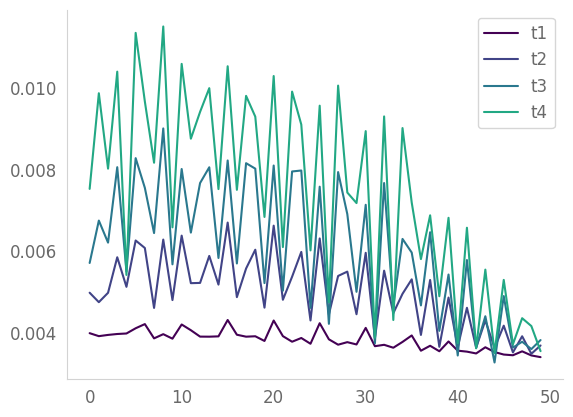

In [28]:
plt.plot(l_loss['0.0:1.0'],label = 't1')
plt.plot(l_loss['1.0:2.0'],label = 't2')
plt.plot(l_loss['2.0:3.0'],label = 't3')
plt.plot(l_loss['3.0:4.0'],label = 't4')
plt.legend()

# test

In [29]:
f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/best_model'),map_location=torch.device('cpu')))
f_net.to(device)
for param in f_net.g_net.parameters():
    param.requires_grad = False


/tmp/ipykernel_580071/1813639670.py:1: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



In [30]:
import numpy as np

gt = np.array([1.1050, 1.3250, 1.7250, 2.4225])
pred = np.array([1.1073524951934814,1.3286553621292114,1.7299498319625854,2.4260575771331787])
np.abs(gt-pred)/gt*100

array([0.21289549, 0.27587639, 0.28694678, 0.14685561])

In [31]:
f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/best_model'),map_location=torch.device('cpu')))

/tmp/ipykernel_580071/3534936652.py:1: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



<All keys matched successfully>

In [32]:
# generate plot data
f_net.to('cpu')
generated, trajectories,generated_weights,trajectories_weights = generate_plot_data(
    f_net, df, n_points=400, n_trajectories=400, n_bins=100, 
    sample_with_replacement=True, use_cuda=use_cuda, samples_key='samples',
    logger=logger
    )


tensor([0., 1., 2., 3., 4.])
<class 'torch.Tensor'>
tensor([0.0000, 0.0404, 0.0808, 0.1212, 0.1616, 0.2020, 0.2424, 0.2828, 0.3232,
        0.3636, 0.4040, 0.4444, 0.4848, 0.5253, 0.5657, 0.6061, 0.6465, 0.6869,
        0.7273, 0.7677, 0.8081, 0.8485, 0.8889, 0.9293, 0.9697, 1.0101, 1.0505,
        1.0909, 1.1313, 1.1717, 1.2121, 1.2525, 1.2929, 1.3333, 1.3737, 1.4141,
        1.4545, 1.4949, 1.5354, 1.5758, 1.6162, 1.6566, 1.6970, 1.7374, 1.7778,
        1.8182, 1.8586, 1.8990, 1.9394, 1.9798, 2.0202, 2.0606, 2.1010, 2.1414,
        2.1818, 2.2222, 2.2626, 2.3030, 2.3434, 2.3838, 2.4242, 2.4646, 2.5051,
        2.5455, 2.5859, 2.6263, 2.6667, 2.7071, 2.7475, 2.7879, 2.8283, 2.8687,
        2.9091, 2.9495, 2.9899, 3.0303, 3.0707, 3.1111, 3.1515, 3.1919, 3.2323,
        3.2727, 3.3131, 3.3535, 3.3939, 3.4343, 3.4747, 3.5152, 3.5556, 3.5960,
        3.6364, 3.6768, 3.7172, 3.7576, 3.7980, 3.8384, 3.8788, 3.9192, 3.9596,
        4.0000])
<class 'torch.Tensor'>


In [33]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def plot_g_values(df, f_net, device=device, output_file='plot.pdf'):
    time_points = df['samples'].unique()
    
    data_by_time = {}
    
    for time in time_points:
        subset = df[df['samples'] == time]
        x = torch.tensor(subset['x1'].values, dtype=torch.float32).to(device)
        y = torch.tensor(subset['x2'].values, dtype=torch.float32).to(device)
        data = torch.stack([x, y], dim=1)
        
        with torch.no_grad():
            t = torch.tensor([time], dtype=torch.float32).to(device)
            _, g, _, _ = f_net(t, data)
        
        data_by_time[time] = {'data': subset, 'g_values': g.detach().cpu().numpy()}
    
    all_g_values = np.concatenate([content['g_values'] for content in data_by_time.values()])
    
    vmax_value = np.percentile(all_g_values, 99)
    
    norm = plt.Normalize(vmin=all_g_values.min(), vmax=vmax_value, clip=True)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    for time, content in data_by_time.items():
        subset = content['data']
        g_values = content['g_values']
        x = subset['x1']
        y = subset['x2']
        
        colors = plt.cm.rainbow(norm(g_values))
        
        ax.scatter(x, y, color=colors, label=f'Time {time}', alpha=0.7, marker='o')
    
    ax.set_xlabel('Gene $X_1$')
    ax.set_ylabel('Gene $X_2$')
    
    sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
    sm.set_array(all_g_values)
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('Normalized predicted growth rate')
    
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{norm(x):.2f}'))
    
    plt.show()

plot_g_values(df, f_net, output_file='gene_growth_pre_post.pdf')

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cpu and cuda:0! (when checking argument for argument mat1 in method wrapper_CUDA_addmm)

In [ ]:
    plot_comparision(
        df, generated, trajectories,
        palette = 'viridis', df_time_key='samples',
        save=True, path=exp_dir, file='comparision.png',
        x='x1', y='x2', is_3d=False
    )

NameError: name 'df' is not defined

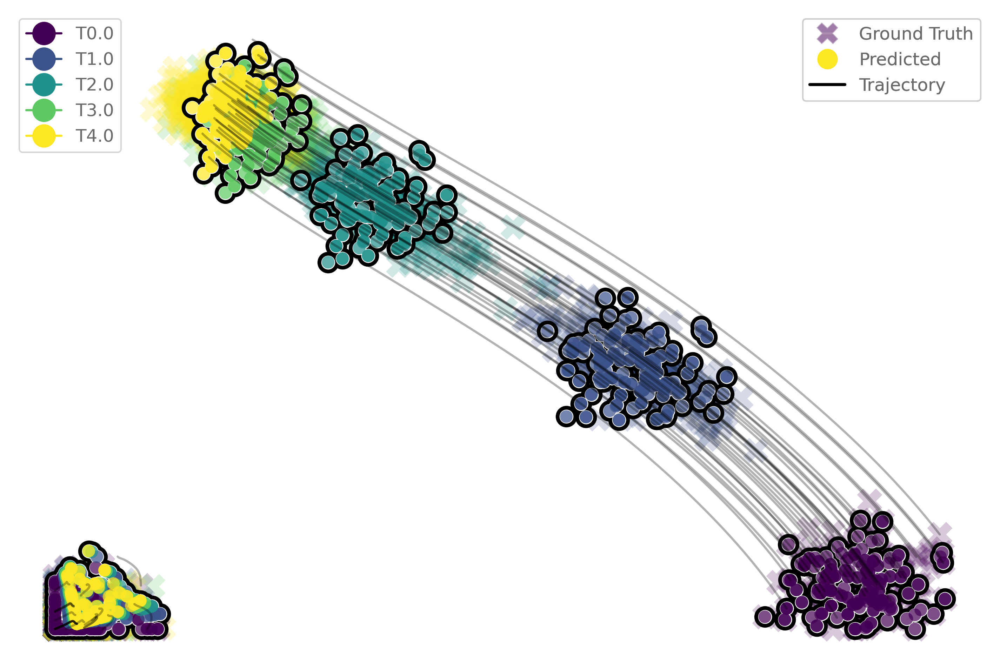

In [ ]:
    plot_comparision(
        df, generated, trajectories,
        palette = 'viridis', df_time_key='samples',
        save=True, path=exp_dir, file='comparision.png',
        x='x1', y='x2', is_3d=False
    )

In [ ]:
f_net.to(device)
data=torch.tensor(df[df['samples']==0].values,dtype=torch.float32).requires_grad_()
data_t0 = data[:, 1:3].clone().detach().to(device).requires_grad_()

lnw0 = torch.log(torch.ones(sample_size[0],1,dtype=torch.float32) / (initial_size)).to(device).requires_grad_()  
initial_state_energy = (data_t0, lnw0)
t=torch.tensor([0.0,2.0],dtype=torch.float32).requires_grad_()
x_t, lnw_t=odeint(ODEFunc2(f_net),initial_state_energy,t,options=dict(step_size=0.01),method='euler')


final_mass=lnw_t[-1]
final_mass=torch.exp(final_mass)
weight=final_mass/final_mass.sum()

### Pretrain score

DataFrame shape: (3031, 3)
DataFrame columns: Index(['samples', 'x1', 'x2'], dtype='object')
obsm_data shape: (3031, 2)
AnnData object with n_obs × n_vars = 3031 × 0
    obsm: 'X_pca'


/lustre/home/2301110060/software/miniconda3/envs/DeepRUOT/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/lustre/home/2301110060/software/miniconda3/envs/DeepRUOT/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


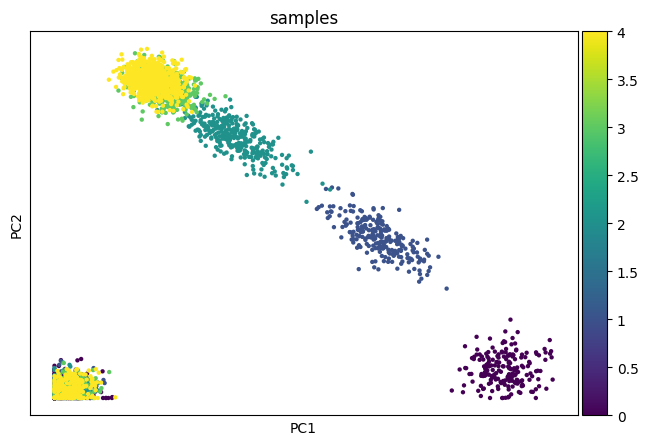

5


In [ ]:
import pandas as pd
import anndata as ad

f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/best_model'),map_location=torch.device('cpu')))
f_net.to(device)

print("DataFrame shape:", df.shape)
print("DataFrame columns:", df.columns)
n=dim
samples = df['samples'].values
column_names = [f'x{i}' for i in range(1, n + 1)]

obsm_data = df[column_names].values
print("obsm_data shape:", obsm_data.shape)

adata = ad.AnnData(obs=pd.DataFrame(index=samples))


adata.obsm['X_pca'] = obsm_data


adata_loaded = adata


print(adata_loaded)

import scanpy as sc

adata.obs['samples']=df['samples'].values
sc.pl.scatter(adata, basis="pca", color="samples")

n_times = len(adata.obs["samples"].unique())
print(n_times)
X = [
    adata.obsm["X_pca"][adata.obs["samples"] == t]
    for t in range(n_times)
]

In [ ]:
from DeepRUOT.utils import OTPlanSampler, ConditionalFlowMatcher, ExactOptimalTransportConditionalFlowMatcher, TargetConditionalFlowMatcher,SchrodingerBridgeConditionalFlowMatcher, VariancePreservingConditionalFlowMatcher,generate_state_trajectory
from DeepRUOT.models import scoreNet2

batch_size = df[df['samples']==0].x1.shape[0]
sigma = 0.25
time = torch.Tensor(groups)
SF2M = SchrodingerBridgeConditionalFlowMatcher(sigma=sigma)
sf2m_score_model=scoreNet2(in_out_dim=dim, hidden_dim=128,  activation='leakyrelu').float().to(device)
sf2m_optimizer = torch.optim.Adam(
    list(sf2m_score_model.parameters()), 1e-4
)
trajectory = generate_state_trajectory(X, n_times,batch_size, f_net, time, device)

In [ ]:
from DeepRUOT.utils import get_batch

max_norm_ut = torch.tensor(0.0)
lambda_penalty=0
for i in tqdm(range(3001)):
    sf2m_optimizer.zero_grad()
    t, xt, ut,eps = get_batch(SF2M, X, trajectory,batch_size, n_times, return_noise=True)
    t=torch.unsqueeze(t,1)
    lambda_t = SF2M.compute_lambda(t % 1)
    value_st=sf2m_score_model(t, xt)
    st = sf2m_score_model.compute_gradient(t, xt)
    positive_st = torch.relu(value_st)
    penalty = lambda_penalty * torch.max(positive_st)

    # max_norm_ut = torch.maximum(torch.max(torch.sum(ut**2, dim=1)), max_norm_ut)
    score_loss = torch.mean((lambda_t[:, None] * st + eps) ** 2)
    if i % 100 == 0:
        print(torch.max(positive_st))
        print(f"{i}:  {score_loss.item():0.2f}")
    loss = score_loss+penalty

    loss.backward()
    sf2m_optimizer.step()

  0%|          | 2/3001 [00:00<03:37, 13.77it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
0:  0.99


  3%|▎         | 102/3001 [00:07<03:23, 14.26it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
100:  0.82


  7%|▋         | 202/3001 [00:14<03:16, 14.25it/s]

tensor(0.0413, device='cuda:0', grad_fn=<MaxBackward1>)
200:  0.66


 10%|█         | 302/3001 [00:21<03:09, 14.23it/s]

tensor(0.2164, device='cuda:0', grad_fn=<MaxBackward1>)
300:  0.60


 13%|█▎        | 402/3001 [00:28<03:02, 14.26it/s]

tensor(0.4356, device='cuda:0', grad_fn=<MaxBackward1>)
400:  0.61


 17%|█▋        | 502/3001 [00:35<02:55, 14.26it/s]

tensor(0.6048, device='cuda:0', grad_fn=<MaxBackward1>)
500:  0.58


 20%|██        | 602/3001 [00:42<02:48, 14.25it/s]

tensor(0.6926, device='cuda:0', grad_fn=<MaxBackward1>)
600:  0.54


 23%|██▎       | 702/3001 [00:49<02:41, 14.26it/s]

tensor(0.7098, device='cuda:0', grad_fn=<MaxBackward1>)
700:  0.53


 27%|██▋       | 802/3001 [00:57<03:02, 12.07it/s]

tensor(0.5767, device='cuda:0', grad_fn=<MaxBackward1>)
800:  0.53


 30%|███       | 902/3001 [01:04<02:27, 14.25it/s]

tensor(0.4652, device='cuda:0', grad_fn=<MaxBackward1>)
900:  0.53


 33%|███▎      | 1002/3001 [01:11<02:20, 14.25it/s]

tensor(0.4627, device='cuda:0', grad_fn=<MaxBackward1>)
1000:  0.54


 37%|███▋      | 1102/3001 [01:18<02:13, 14.24it/s]

tensor(0.4661, device='cuda:0', grad_fn=<MaxBackward1>)
1100:  0.54


 40%|████      | 1202/3001 [01:25<02:06, 14.27it/s]

tensor(0.4728, device='cuda:0', grad_fn=<MaxBackward1>)
1200:  0.55


 43%|████▎     | 1302/3001 [01:32<01:59, 14.27it/s]

tensor(0.4222, device='cuda:0', grad_fn=<MaxBackward1>)
1300:  0.52


 47%|████▋     | 1402/3001 [01:39<01:52, 14.25it/s]

tensor(0.4192, device='cuda:0', grad_fn=<MaxBackward1>)
1400:  0.54


 50%|█████     | 1502/3001 [01:46<01:45, 14.25it/s]

tensor(0.5344, device='cuda:0', grad_fn=<MaxBackward1>)
1500:  0.53


 53%|█████▎    | 1602/3001 [01:53<01:38, 14.25it/s]

tensor(0.5400, device='cuda:0', grad_fn=<MaxBackward1>)
1600:  0.54


 57%|█████▋    | 1702/3001 [02:00<01:31, 14.25it/s]

tensor(0.5698, device='cuda:0', grad_fn=<MaxBackward1>)
1700:  0.52


 60%|██████    | 1802/3001 [02:07<01:24, 14.25it/s]

tensor(0.4072, device='cuda:0', grad_fn=<MaxBackward1>)
1800:  0.50


 63%|██████▎   | 1902/3001 [02:14<01:17, 14.23it/s]

tensor(0.1181, device='cuda:0', grad_fn=<MaxBackward1>)
1900:  0.52


 67%|██████▋   | 2002/3001 [02:21<01:10, 14.25it/s]

tensor(0.2270, device='cuda:0', grad_fn=<MaxBackward1>)
2000:  0.49


 70%|███████   | 2102/3001 [02:28<01:02, 14.27it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2100:  0.53


 73%|███████▎  | 2202/3001 [02:35<00:56, 14.27it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2200:  0.48


 77%|███████▋  | 2302/3001 [02:42<00:49, 14.25it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2300:  0.47


 80%|████████  | 2402/3001 [02:49<00:41, 14.27it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2400:  0.53


 83%|████████▎ | 2502/3001 [02:56<00:35, 14.25it/s]

tensor(0.1869, device='cuda:0', grad_fn=<MaxBackward1>)
2500:  0.49


 87%|████████▋ | 2602/3001 [03:03<00:28, 14.23it/s]

tensor(0.2245, device='cuda:0', grad_fn=<MaxBackward1>)
2600:  0.55


 90%|█████████ | 2702/3001 [03:10<00:20, 14.27it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2700:  0.50


 93%|█████████▎| 2802/3001 [03:17<00:13, 14.26it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2800:  0.50


 97%|█████████▋| 2902/3001 [03:24<00:06, 14.27it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
2900:  0.46


100%|██████████| 3001/3001 [03:31<00:00, 14.21it/s]

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
3000:  0.48


Please note that here we need -log s values at each time point do not become negative. If they do, this could lead to exponential blow-up during following train_all. You can inspect this by looking at the output of the score pretraining—e.g., in lines like:

tensor(0., device='cuda:0', grad_fn=<MaxBackward1>)
3000:  0.48

If the value here is not 0, that might indicate a problem. To mitigate this, one trick is to adjust the lambda_penalty parameter—try setting it to 1 for some epochs, then switching it to 0 for additional epochs (see our paper C.3 TRAINING INITIAL LOG DENSITY FUNCTION). This can help stabilize training and avoid negative -log s. Or you can choose to set lambda_initial=0 in train_all (this cause the instability).

In [ ]:
torch.save(sf2m_score_model.state_dict(), os.path.join(exp_dir, 'score_model'))

torch.Size([10000, 1])
torch.Size([10000, 2])


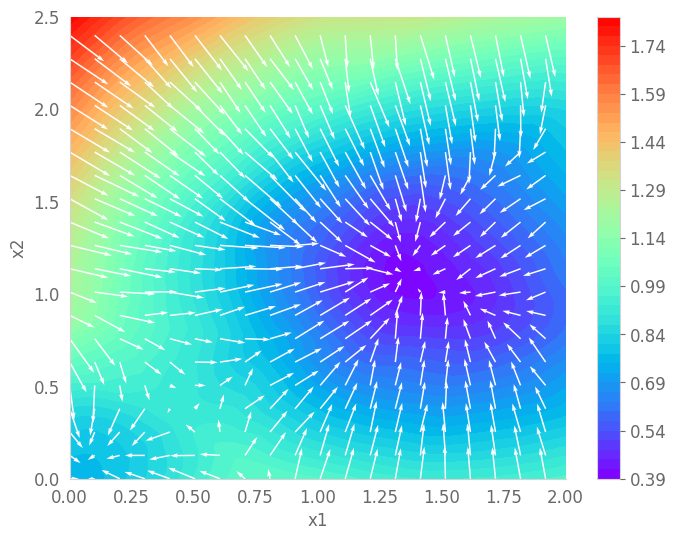

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch



x_range = np.linspace(0, 2, 100)
y_range = np.linspace(0, 2.5, 100)
xv, yv = np.meshgrid(x_range, y_range)
grid_points = np.stack([xv, yv], axis=-1).reshape(-1, 2)

grid_points_tensor = torch.tensor(grid_points).float().to(device)

expanded_tensor = grid_points_tensor

t_value = 1.0  
t_tensor = torch.tensor([t_value] * grid_points.shape[0]).unsqueeze(1).float().to(device)
print(t_tensor.shape)

expanded_tensor.requires_grad_(True)
log_density_values = sf2m_score_model(t_tensor, expanded_tensor)

density_values=torch.exp(log_density_values)

log_density_values.backward(torch.ones_like(log_density_values))
gradients = expanded_tensor.grad
print(gradients.shape)
gradients_np = gradients.cpu().detach().numpy().reshape(100, 100, 2)

step = 5
xv_quiver = xv[::step, ::step]
yv_quiver = yv[::step, ::step]
gradients_np_quiver = gradients_np[::step, ::step, :]

plt.figure(figsize=(8, 6))
plt.contourf(xv, yv, -log_density_values.cpu().detach().numpy().reshape(100, 100), levels=50, cmap='rainbow')
plt.colorbar(label=' ')
plt.quiver(xv_quiver, yv_quiver, gradients_np_quiver[:, :, 0], gradients_np_quiver[:, :, 1], color='white', scale=10)
plt.xlabel('x1')
plt.ylabel('x2')
#plt.savefig('score_t_0_gaussian.pdf')
plt.show()

### Train

In [ ]:
sf2m_score_model.load_state_dict(torch.load(os.path.join(exp_dir, 'score_model'),map_location=torch.device('cpu')))
sf2m_score_model.to(device)
f_net.load_state_dict(torch.load(os.path.join(exp_dir+'/best_model'),map_location=torch.device('cpu')))
f_net.to(device)
for param in f_net.g_net.parameters():
    param.requires_grad = True

FNet(
  (v_net): velocityNet(
    (activation): LeakyReLU(negative_slope=0.01)
    (net): ModuleList(
      (0): Sequential(
        (0): Linear(in_features=3, out_features=128, bias=True)
        (1): LeakyReLU(negative_slope=0.01)
      )
      (1-2): 2 x Sequential(
        (0): Linear(in_features=128, out_features=128, bias=True)
        (1): LeakyReLU(negative_slope=0.01)
      )
    )
    (out): Linear(in_features=128, out_features=2, bias=True)
  )
  (g_net): growthNet(
    (activation): LeakyReLU(negative_slope=0.01)
    (net): Sequential(
      (0): Linear(in_features=3, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=128, out_features=128, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
      (4): Linear(in_features=128, out_features=128, bias=True)
      (5): LeakyReLU(negative_slope=0.01)
      (6): Linear(in_features=128, out_features=1, bias=True)
    )
  )
  (s_net): scoreNet(
    (activation): LeakyReLU(negative_

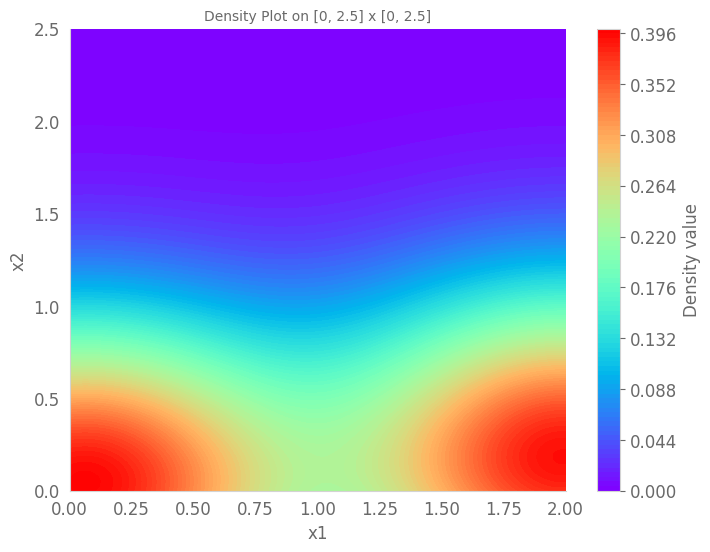

In [ ]:
import numpy as np
from DeepRUOT.utils import density1
import matplotlib.pyplot as plt
import torch

datatime0=torch.zeros(df[df['samples']==0].x1.shape[0],2)
datatime0[:,0]=torch.tensor(df[df['samples']==0].x1)
datatime0[:,1]=torch.tensor(df[df['samples']==0].x2)
device='cpu'

x_range = np.linspace(0, 2, 100)
y_range = np.linspace(0, 2.5, 100)
xv, yv = np.meshgrid(x_range, y_range)
grid_points = np.stack([xv, yv], axis=-1).reshape(-1, 2)

grid_points_tensor = torch.tensor(grid_points).float().to(device)

with torch.no_grad():
    function_values = density1(grid_points_tensor,datatime0,device).cpu().detach().numpy().reshape(100, 100)
    
plt.figure(figsize=(8, 6))
plt.contourf(xv, yv, function_values, levels=100, cmap='rainbow')
plt.colorbar(label='Density value')
plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Density Plot on [0, 2.5] x [0, 2.5]')
plt.show()

In [ ]:
from DeepRUOT.train import train_all
device='cpu'
optimizer = torch.optim.SGD(list(f_net.parameters())+list(sf2m_score_model.parameters()),1e-5)


In [ ]:

    if n_local_epochs > 0:
        logger.info(f'Beginning Training')
        for epoch in tqdm(range(1), desc='Training Epoch'):
            l_loss, b_loss, g_loss = train_all(
                f_net, df, groups, optimizer,10,
                criterion = criterion, use_cuda = use_cuda,
                local_loss=True, global_loss=False, apply_losses_in_time=apply_losses_in_time,
                hold_one_out=hold_one_out, hold_out=hold_out, sf2m_score_model=sf2m_score_model,
                 hinge_value=hinge_value,datatime0=datatime0,device=device, lambda_initial=0.1,
                 use_pinn=True, use_penalty=True,use_density_loss=False,lambda_density=10,
                top_k = top_k, sample_size = sample_size,relative_mass=relative_mass,initial_size=initial_size,
                sample_with_replacement = sample_with_replacement, logger=logger, sigmaa=sigma,lambda_pinn=1,
            )
            for k, v in l_loss.items():  
                local_losses[k].extend(v)
            batch_losses.extend(b_loss)
            globe_losses.extend(g_loss)


Training Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

begin local loss


  0%|          | 0/10 [00:00<?, ?it/s]

Otloss
tensor(0.0328, grad_fn=<SumBackward0>)
mass loss
tensor(0.0112, grad_fn=<PowBackward0>)
energy loss
tensor(0.0008, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0667, grad_fn=<SumBackward0>)
mass loss
tensor(0.0469, grad_fn=<PowBackward0>)
energy loss
tensor(0.0020, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0883, grad_fn=<SumBackward0>)
mass loss
tensor(0.1090, grad_fn=<PowBackward0>)
energy loss
tensor(0.0035, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0804, grad_fn=<SumBackward0>)
mass loss
tensor(0.3514, grad_fn=<PowBackward0>)
energy loss
tensor(0.0055, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0328, grad_fn=<SumBackward0>)
mass loss
tensor(0.0112, grad_fn=<PowBackward0>)
energy loss
tensor(0.0008, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0667, grad_fn=<SumBackward0>)
mass loss
tensor(0.0472, grad_fn=<PowBackward0>)
energy loss
tensor(0.0020, grad_fn=<MeanBackward0>)
pinloss
0
Otloss
tensor(0.0882, grad_fn=<SumBackward0>)
mass loss
te

Training Epoch: 100%|██████████| 1/1 [00:12<00:00, 12.17s/it]


In [ ]:
torch.save(sf2m_score_model.state_dict(), os.path.join(exp_dir, 'score_model_result'))
torch.save(f_net.state_dict(), os.path.join(exp_dir, 'model_result'))

In [ ]:
data=torch.tensor(df[df['samples']==0].values,dtype=torch.float32).requires_grad_()
data_t0 = data[:, 1:dim+1].to(device).requires_grad_()
print(data_t0.shape)
x0=data_t0.to(device)

torch.Size([400, 2])


In [ ]:
import torchsde
class SDE(torch.nn.Module):
    noise_type = "diagonal"
    sde_type = "ito"

    def __init__(self, ode_drift, score, input_size=(3, 32, 32), sigma=1.0):
        super().__init__()
        self.drift = ode_drift
        self.score = score
        self.input_size = input_size
        self.sigma = sigma

    # Drift
    def f(self, t, y):
        drift=self.drift(t,y)
        num = y.shape[0]
        t = t.expand(num, 1) 
        return drift+self.score.compute_gradient(t,y)

    # Diffusion
    def g(self, t, y):
        return torch.ones_like(y)*sigma


sde = SDE(f_net.v_net, sf2m_score_model, input_size=(dim,), sigma=sigma)
sde_traj = torchsde.sdeint(
        sde,
        x0.to(device),
        dt=0.01,
        ts=torch.linspace(0, n_times - 1, 400, device=device),
    ).cpu()

In [ ]:
# define sample_number
sample_number = 10 

sample_indices = random.sample(range(sde_traj.size(1)), sample_number)

sampled_sde_trajec = sde_traj[:, sample_indices, :]

sampled_sde_trajec.shape


sampled_sde_trajec = sampled_sde_trajec.tolist()

sampled_sde_trajec = np.array(sampled_sde_trajec, dtype=object)

np.save(exp_dir+'/sde_trajec_our_post_plot.npy', sampled_sde_trajec)


In [ ]:
ts_points=time.to(device)
ts_points

sde_point = torchsde.sdeint(
        sde,
        x0.to(device),
        dt=0.01,
        ts=ts_points,
    ).cpu()

In [ ]:
sde_point_np = sde_point.detach().numpy()

sde_point_list = sde_point_np.tolist()

sde_point_array = np.array(sde_point_list, dtype=object)

np.save(exp_dir+'/sde_point_our_post.npy', sde_point_array)



In [ ]:
sde_point_our_post=np.load(exp_dir+'/sde_point_our_post.npy',allow_pickle=True)


In [ ]:
from DeepRUOT.plots import new_plot_comparisions2

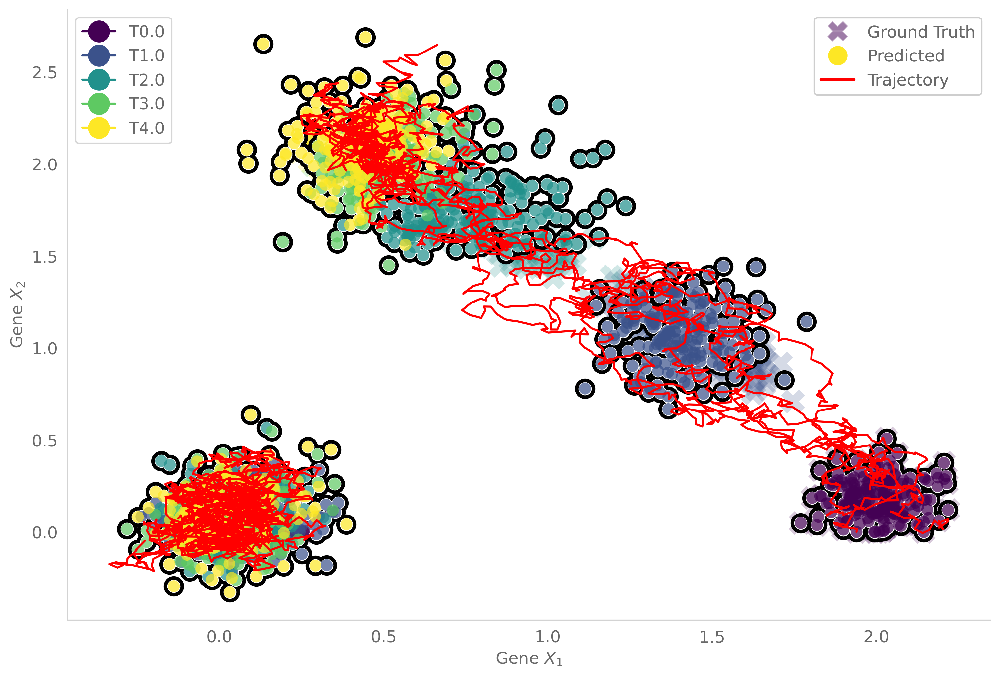

In [ ]:
sde_trajec_our_post_plot=np.load(exp_dir+'/sde_trajec_our_post_plot.npy',allow_pickle=True)
new_plot_comparisions2(
        df, sde_point_our_post, sde_trajec_our_post_plot,
        palette = 'viridis', df_time_key='samples',
        save=True, path=exp_dir, file='sde_trajec_our_post_plot.pdf',
        x='x1', y='x2', z='x3',is_3d=False
    )